In [1]:
import numpy as np
import json
import cv2
import pandas as pd
from scipy import ndimage
import matplotlib.pylab as plt
from numpy import array, zeros, argmin, inf, equal, ndim
from scipy.spatial.distance import cdist

joints_list = ["right_shoulder", "right_elbow", "right_wrist", "left_shoulder","left_elbow", "left_wrist",
        "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
        "right_eye", "right_ear","left_eye", "left_ear"]

import os
import ast

## Load data (first step labels and joint trajectories)

For the first step, only videos in which the batter starts to run are interesting. I therefore created a seperate folder in which I put the json files with the pose estimation output for videos in which the batter starts to run. Of course it is possible to specify another path, but note that the outputs don't make sense if the batter doesn't move.

In [2]:
path = os.path.join("..","train_data","batter_runs")
video_path = os.path.join(path, "videos")
PATH_MODEL = os.path.join("..", "saved_models","batter_first_step")

In [3]:
def from_json(file):
    coordinates = ["x", "y"]
    joints_list = ["right_shoulder", "right_elbow", "right_wrist", "left_shoulder","left_elbow", "left_wrist",
            "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle",
            "right_eye", "right_ear","left_eye", "left_ear", "nose ", "neck"]
    with open(file, 'r') as inf:
        out = json.load(inf)

    liste = []
    for fr in out["frames"]:
        l_joints = []
        for j in joints_list[:12]:
            l_coo = []
            for xy in coordinates:
                l_coo.append(fr[j][xy])
            l_joints.append(l_coo)
        liste.append(l_joints)

    return np.array(liste)


files = []
joints_array_batter = []
path_list = os.listdir(path)
print("Number of available files:", len(path_list))

files = []
for f in path_list: #[:20]:   # CHANGE HERE TO TEST OTHER VIDEOS
    if f[-5:]!=".json" or "video" in f or f[0]==".":
        continue
    name = f[:-5]
    files.append(name)
    joints_array_batter.append(from_json(os.path.join(path, f)))

Number of available files: 169


## Example X and Y trajectories of the batter

File: 495dbb44-facf-4c33-adce-c859631c8a43


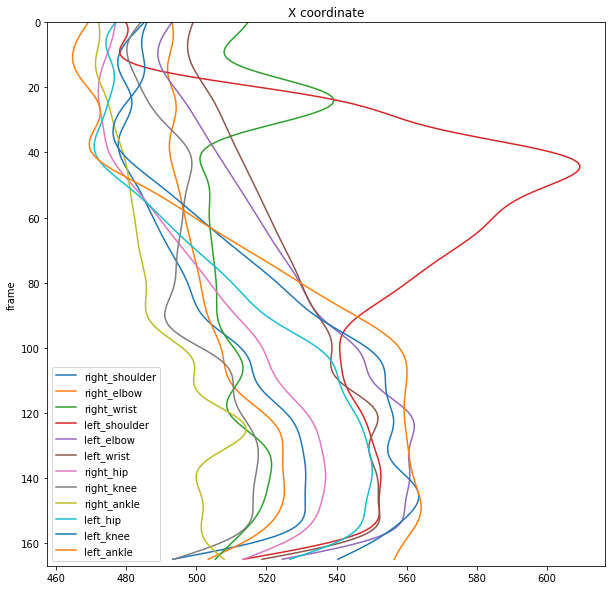

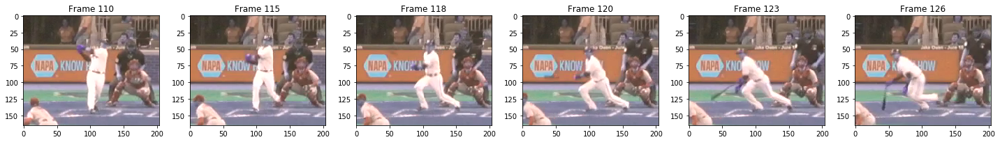

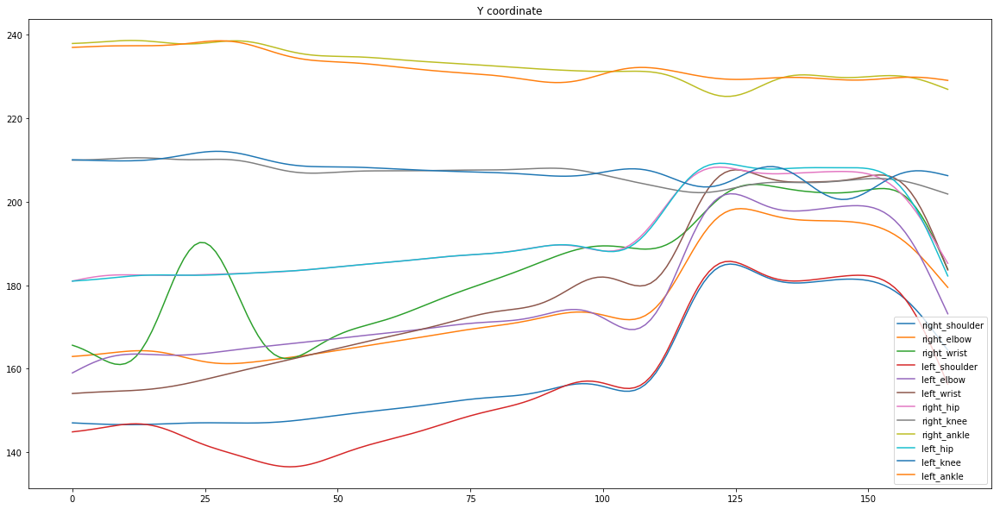

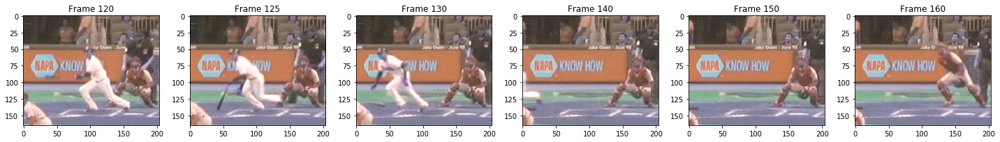

In [4]:
video_choice = 0 #files.index("60c8b309-e459-4a30-b05f-4f6cfaf4ad95")
#SMOOTHING
print("File:", files[video_choice])

plt.figure(figsize = (10,10))
for j in joints_list[:12]:
    plt.plot(joints_array_batter[video_choice][:,joints_list.index(j), 0], np.arange(0,len(joints_array_batter[video_choice]),1), label = j)
plt.title("X coordinate")
plt.ylim(167,0)
plt.ylabel("frame")
plt.legend()
plt.show()

# Plot video frames to visualize maxima in X coordinates
show_frames = [110, 115, 118, 120, 123, 126]
# show_frames = range(foot_down-3, foot_down+3)
fig = plt.figure(figsize=(20, 5))
cap = cv2.VideoCapture(os.path.join(video_path, files[video_choice]+".mp4"))
for i in open(os.path.join(video_path, files[video_choice]+".mp4.dat")).readlines():
        datContent=ast.literal_eval(i)
bottom_b=datContent["Batter"]['bottom']
left_b=datContent["Batter"]['left']
right_b=datContent["Batter"]['right']
top_b=datContent["Batter"]['top']
for ind, i in enumerate(show_frames):
    cap.set(cv2.CAP_PROP_POS_FRAMES, i)
    ret, frame = cap.read()
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(frame[top_b:bottom_b, left_b:right_b])
    plt.gray()
    plt.title("Frame " +str(i))
plt.tight_layout()
plt.show()


plt.figure(figsize = (20,10))
for j in joints_list[:12]: #[one_joint]: 
    plt.plot(joints_array_batter[video_choice][:,joints_list.index(j), 1], label = j)
plt.legend()
#plt.ylim(140, 30)
plt.title("Y coordinate")
plt.show()

# Plot video frames to visualize maxima in Y coordinates
show_frames = [ 120, 125, 130, 140, 150, 160]
# show_frames = range(foot_down-3, foot_down+3)
fig = plt.figure(figsize=(20, 5))
cap = cv2.VideoCapture(os.path.join(video_path, files[video_choice]+".mp4"))
for i in open(os.path.join(video_path, files[video_choice]+".mp4.dat")).readlines():
        datContent=ast.literal_eval(i)
bottom_b=datContent["Batter"]['bottom']
left_b=datContent["Batter"]['left']
right_b=datContent["Batter"]['right']
top_b=datContent["Batter"]['top']
for ind, i in enumerate(show_frames):
    cap.set(cv2.CAP_PROP_POS_FRAMES, i)
    ret, frame = cap.read()
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(frame[top_b:bottom_b, left_b:right_b])
    plt.gray()
    plt.title("Frame " +str(i))
plt.tight_layout()
plt.show()

## Import test functions to find first step, foot up and foot back to ground

In [5]:
from detect_event import first_move_batter_NN, first_move_gradient, foot_to_ground

# Parameter: for the moment the batter lifts his foot and puts the foot back to ground, only the knees and ankles are evaluated.
# the relevant_joints list contains the indices for both knees and ankles
relevant_joints = [7,8, 10,11]

## Get all outputs for the first step (it is faster to process all at once than loading the tensorflow model every time)

In [6]:
first_move_lstm_outputs = first_move_batter_NN(joints_array_batter, [90 for _ in range(len(joints_array_batter))], model = PATH_MODEL)

INFO:tensorflow:Restoring parameters from ../saved_models/batter_first_step
time for nr labels 0.6102821826934814


## Visualize outputs

Note:

* Release frame is always set to 90 here, because it is usually around 90 and only a relatively accurate value is required
* Here, train and test data for the LSTM are mixed. To check only the test data, see comments.

Outputs:

For each video, the first step, the moment the foot is lifted and the frame when the foot is back to ground are plotted. They are plotted on the leg trajectories of Y and then X coordinate. In the X coordinate plot, you can see that when the foot is lifted, there is a peak, and the curve is back to the default position when the foot is back to ground.

For the first step, you can see that in the X coordinate there is a large change, when the batter is moving to one side.

Number of videos 155
--------------NEW VIDEO ------------------
e6165bb7-dcad-412b-beb3-a0bd1210730f
length data (166, 12, 2)
foot highest 91 foot down 100
first step (LSTM):  130 , First step gradient: 129


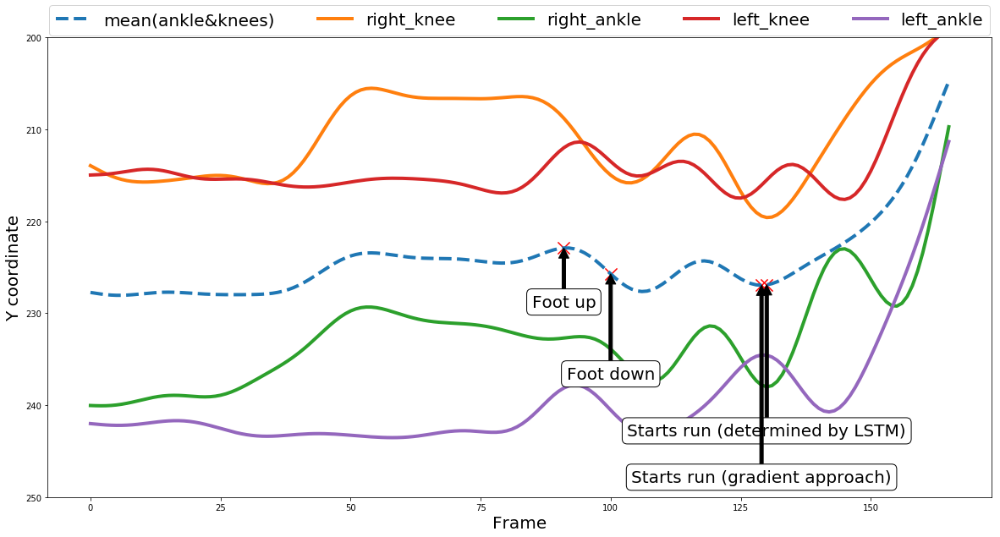

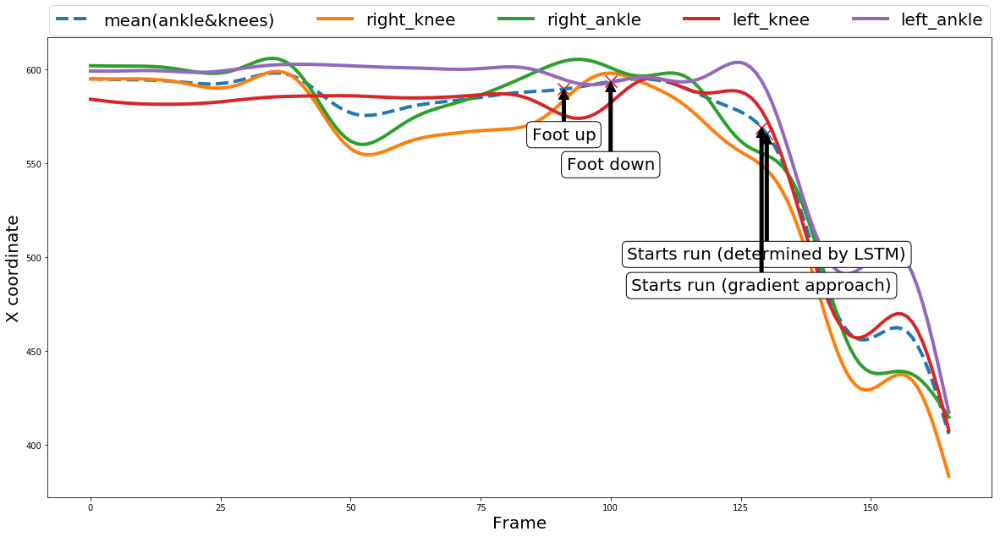

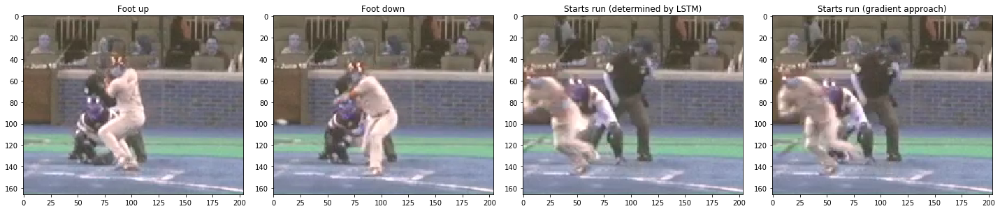


 
 
 

--------------NEW VIDEO ------------------
3bca3062-d7aa-46c9-b729-85373e0dbd87
length data (166, 12, 2)
foot highest 95 foot down 104
first step (LSTM):  127 , First step gradient: 127


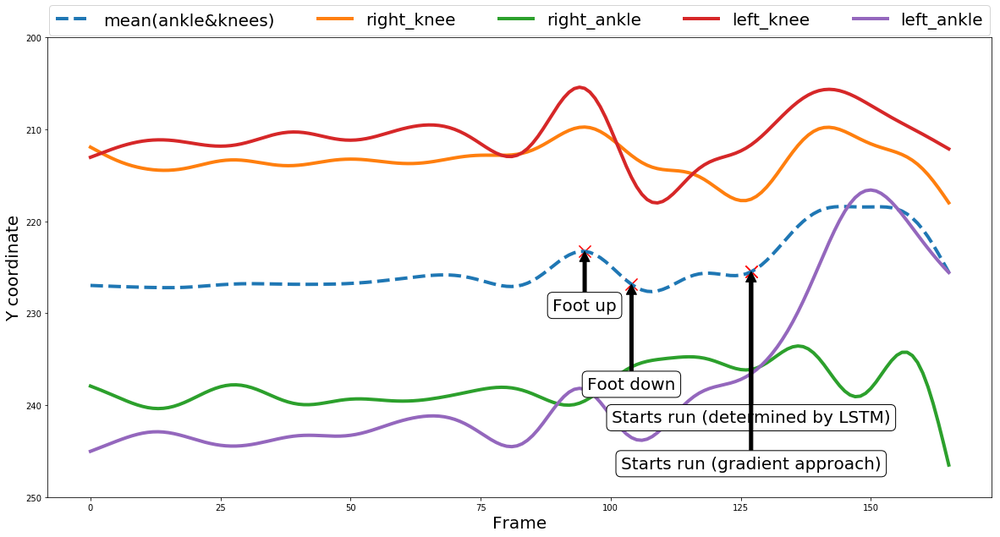

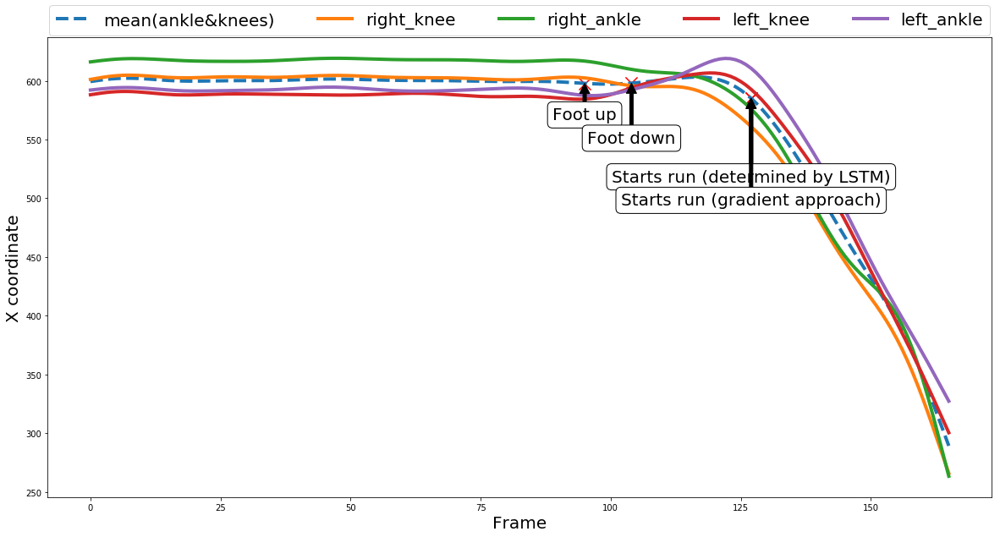

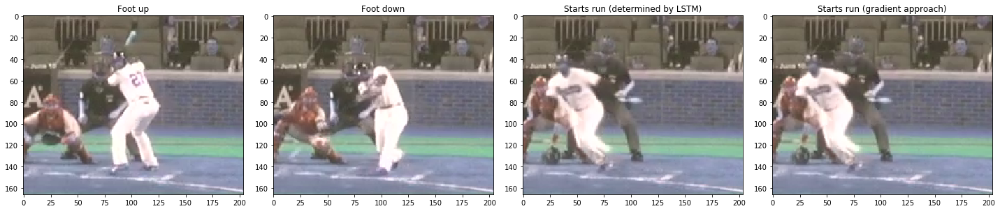


 
 
 

--------------NEW VIDEO ------------------
5735a9b9-f476-4bc6-b1c3-13ab814b232b
length data (166, 12, 2)
foot highest 90 foot down 99
first step (LSTM):  131 , First step gradient: 132


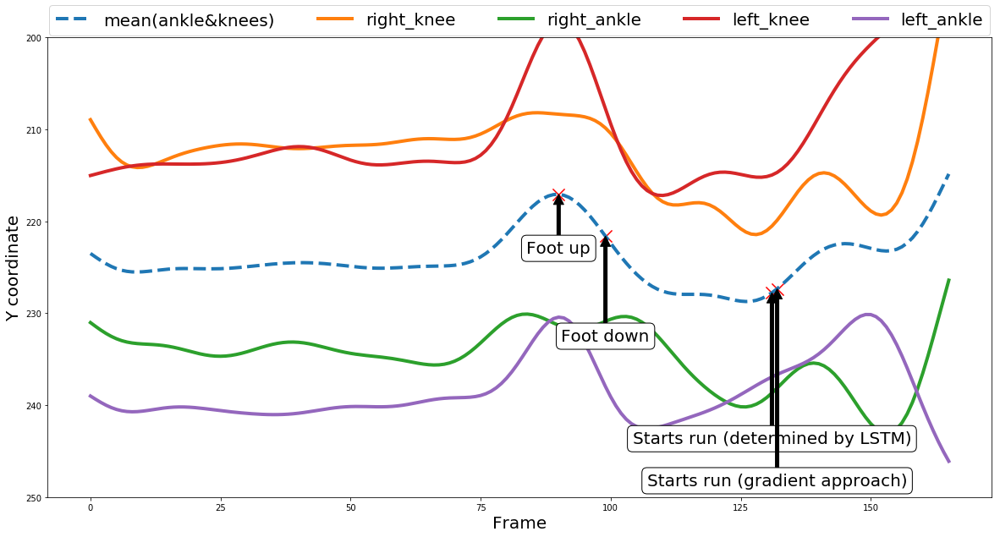

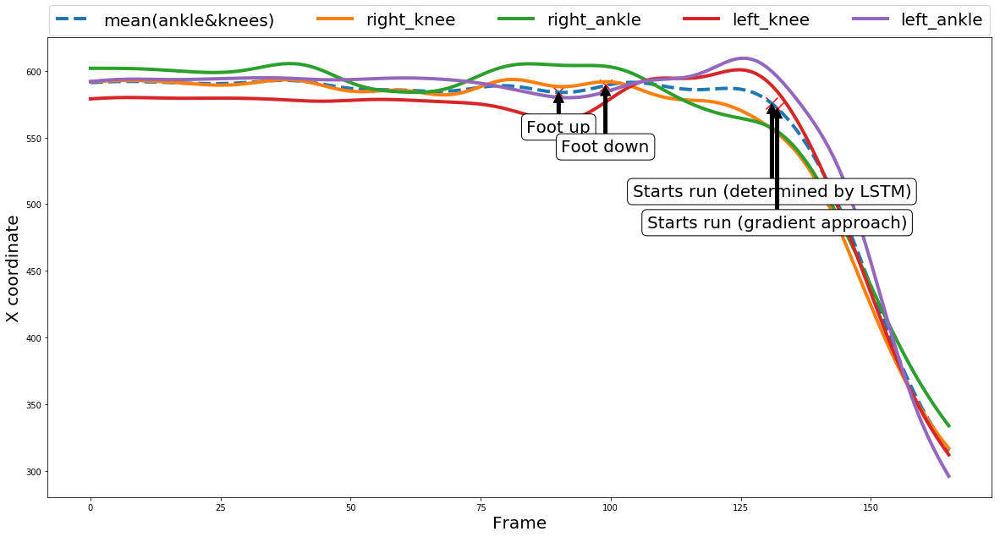

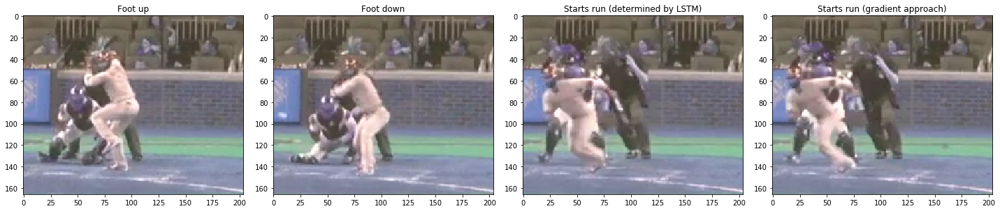


 
 
 

--------------NEW VIDEO ------------------
4ed99ce5-a558-445e-a83e-7b1608c9427e
length data (166, 12, 2)
foot highest 89 foot down 92
first step (LSTM):  124 , First step gradient: 123


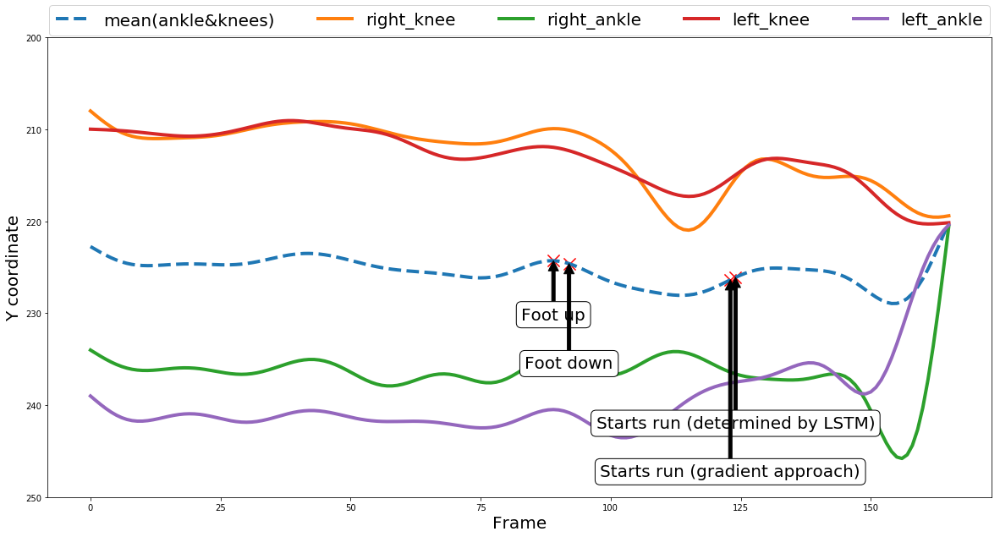

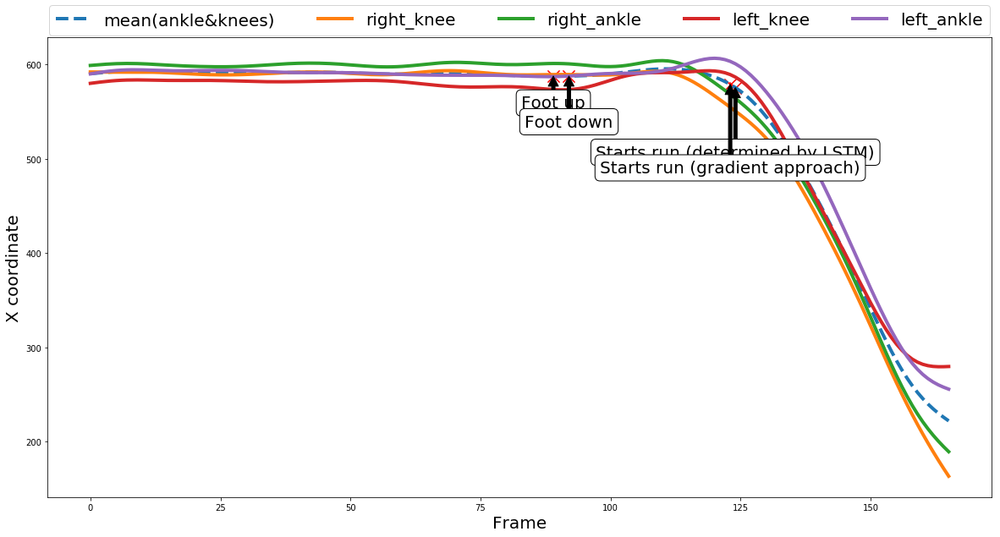

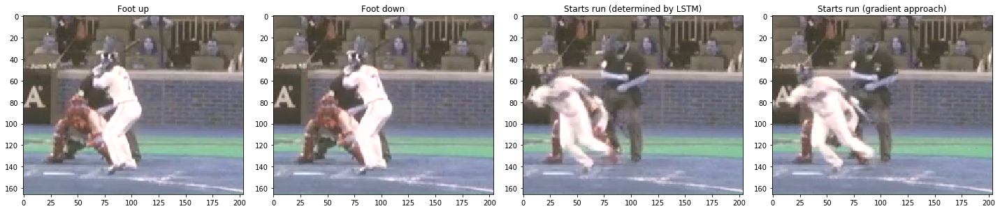


 
 
 

--------------NEW VIDEO ------------------
547fdb80-052f-4a89-a81d-97f8f00b5862
length data (166, 12, 2)
foot highest 90 foot down 99
first step (LSTM):  123 , First step gradient: 125


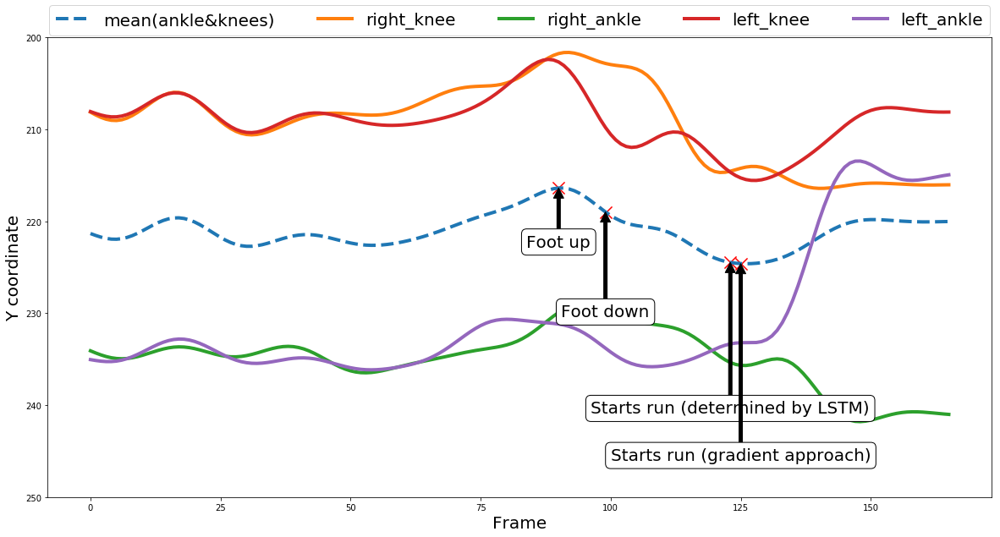

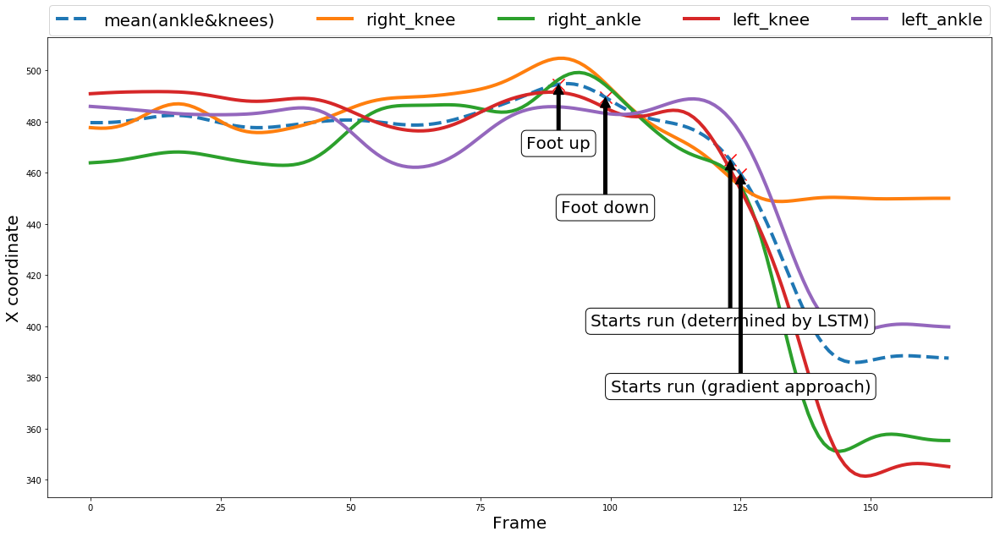

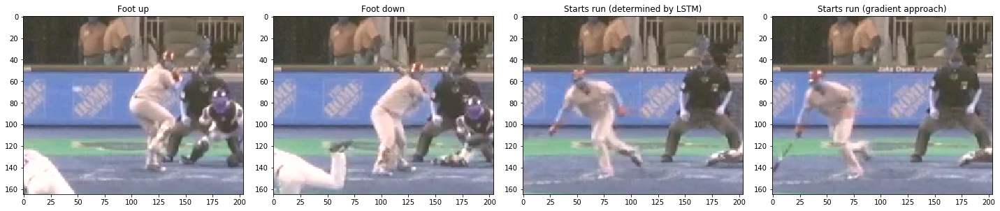


 
 
 

--------------NEW VIDEO ------------------
5048ec21-d47b-42c2-b279-312b088ebd9e
length data (166, 12, 2)
foot highest 92 foot down 99
first step (LSTM):  128 , First step gradient: 128


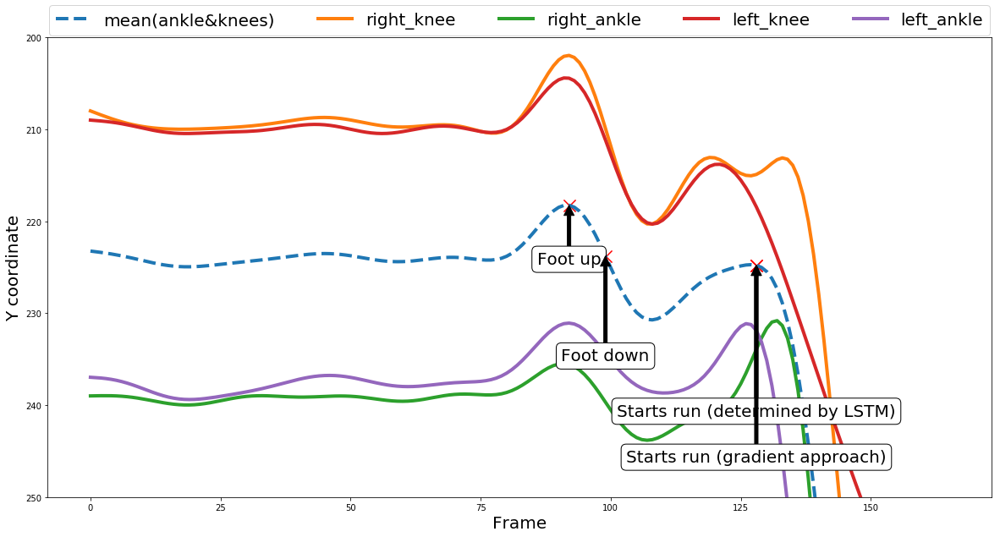

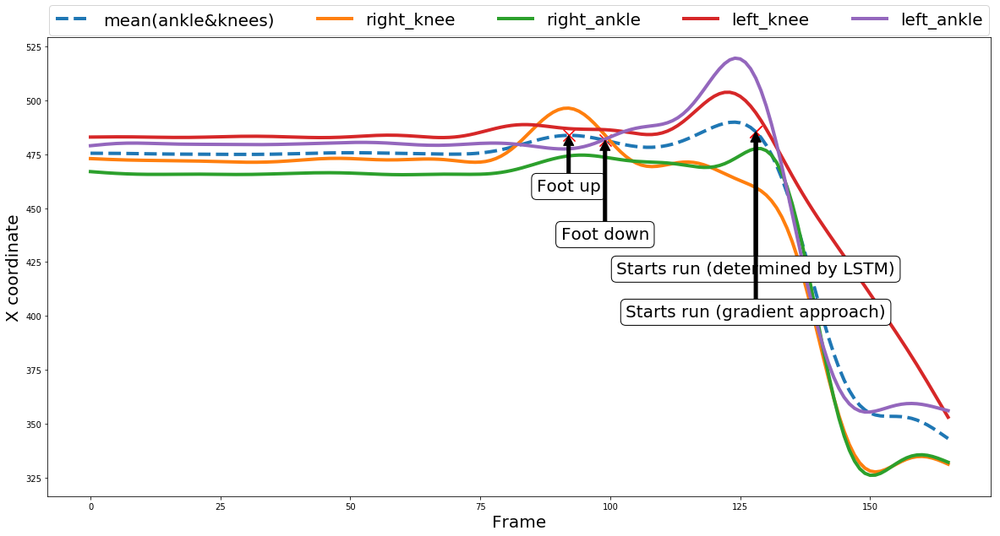

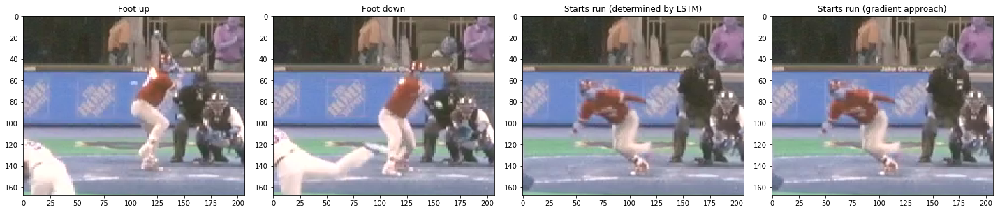


 
 
 

--------------NEW VIDEO ------------------
34a0f21f-bd68-494a-9306-d6708ff36d32
length data (166, 12, 2)
foot highest 92 foot down 98
first step (LSTM):  123 , First step gradient: 123


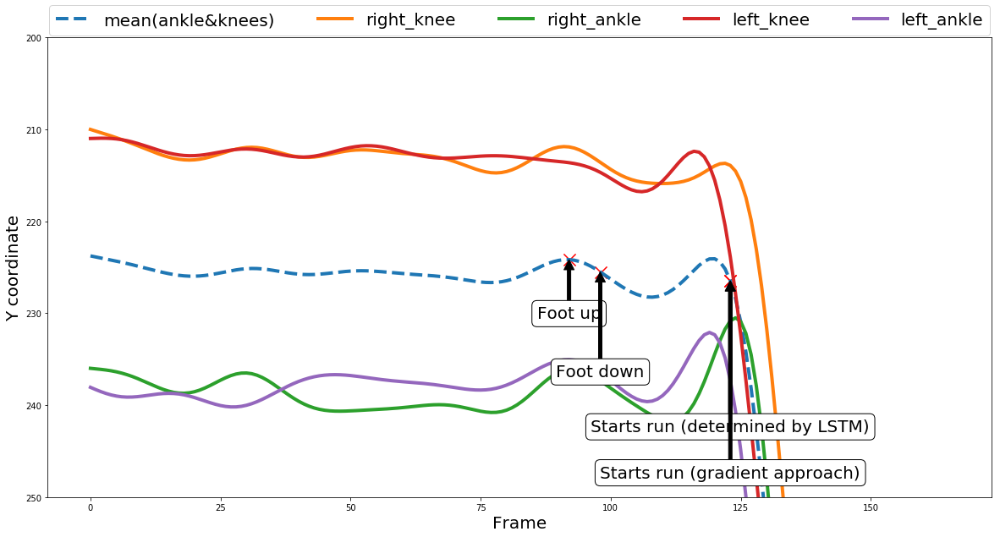

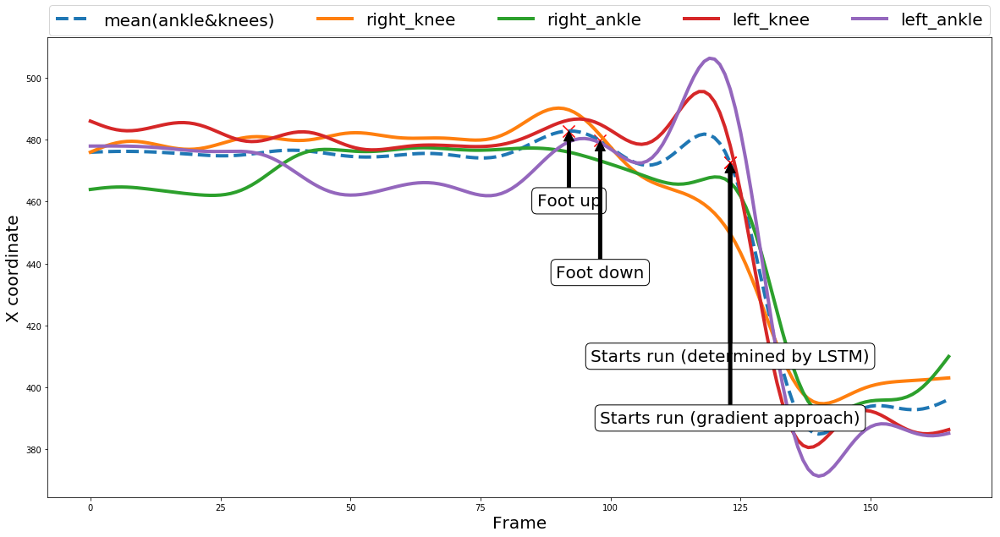

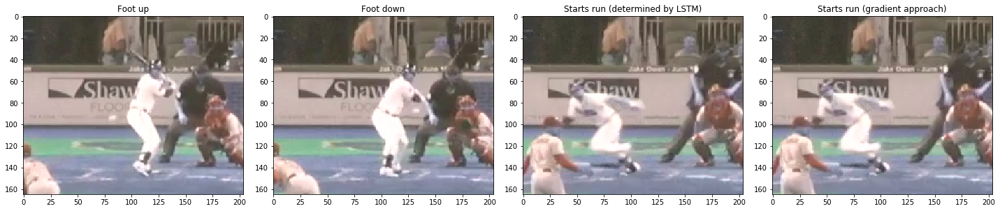


 
 
 

--------------NEW VIDEO ------------------
ed8a313c-2799-4006-8ac0-65a124677b35
length data (166, 12, 2)
foot highest 93 foot down 101
first step (LSTM):  126 , First step gradient: 124


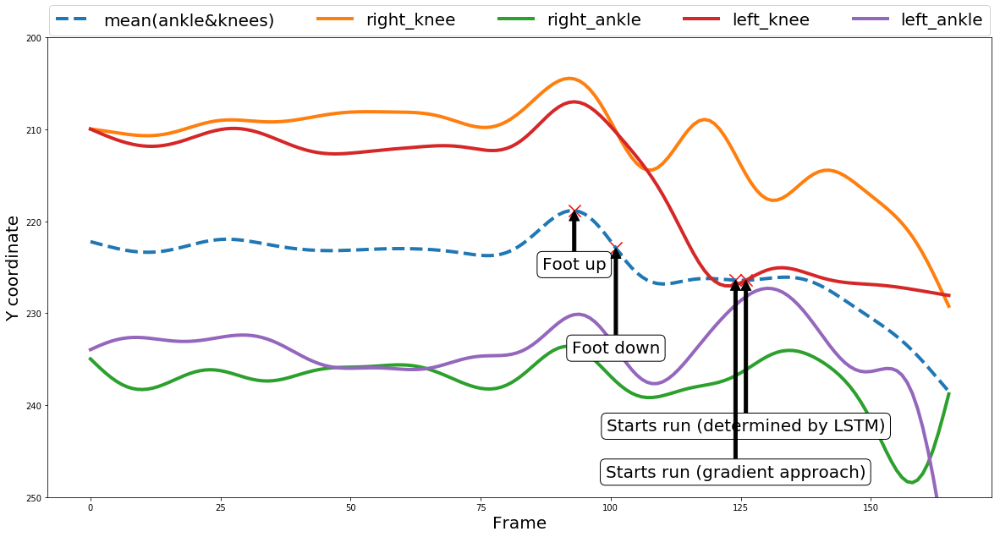

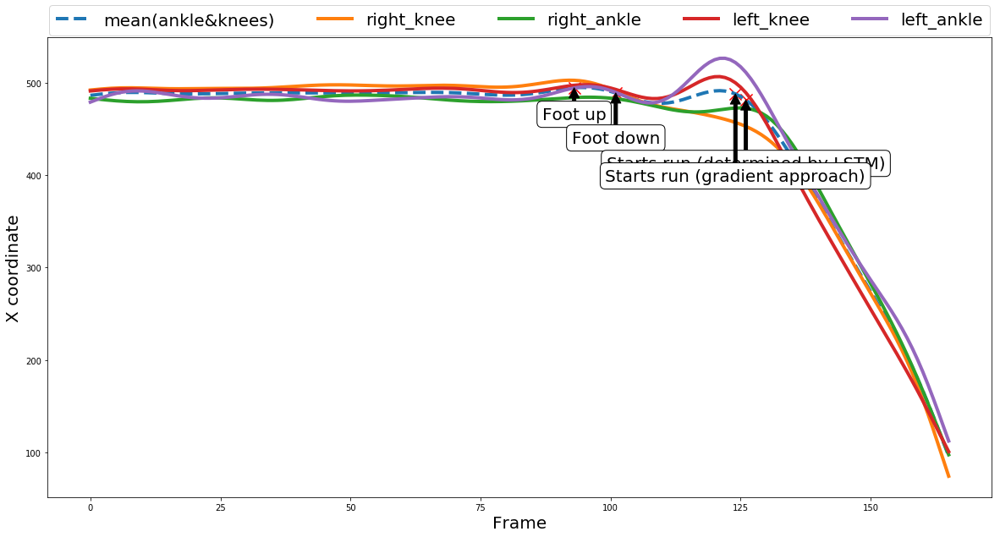

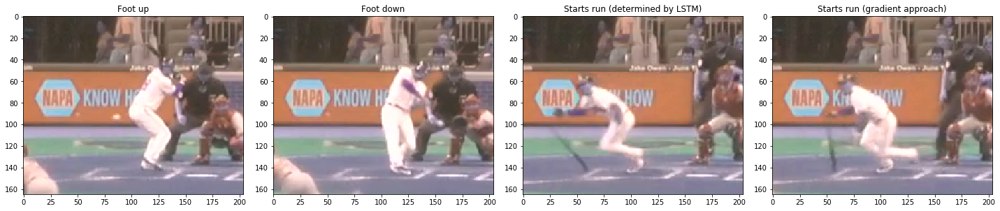


 
 
 

--------------NEW VIDEO ------------------
97507655-eed9-42d5-82b9-6da6c8349ba2
length data (166, 12, 2)
foot highest 88 foot down 96
first step (LSTM):  128 , First step gradient: 126


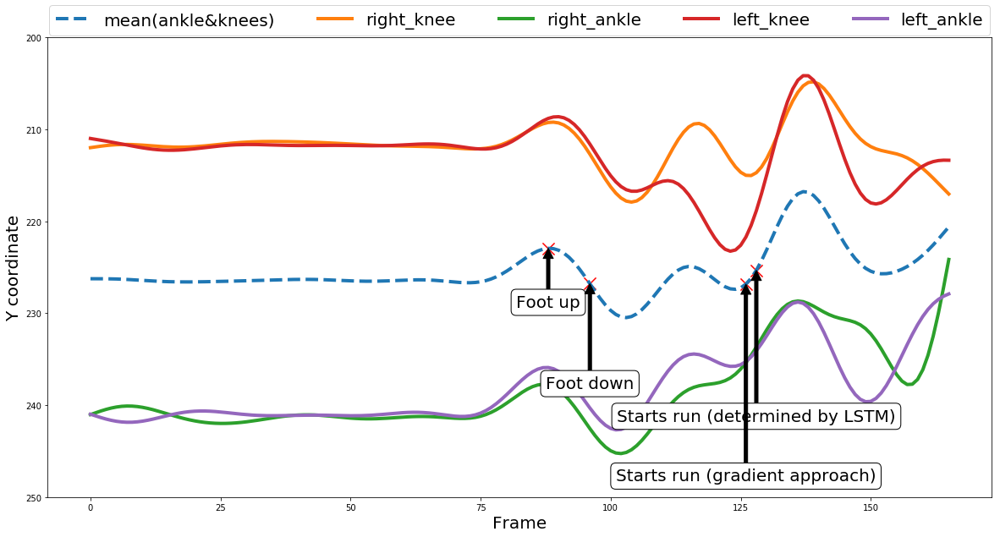

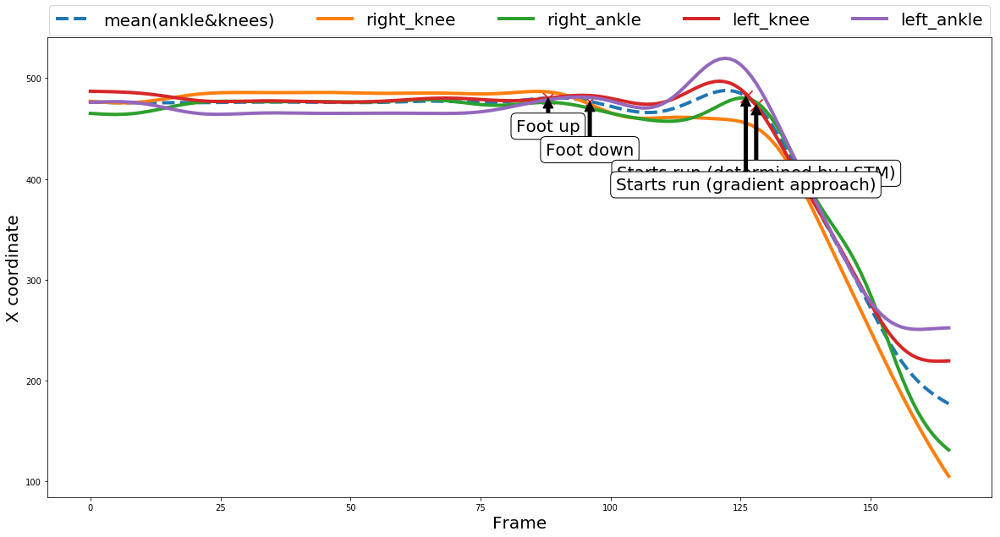

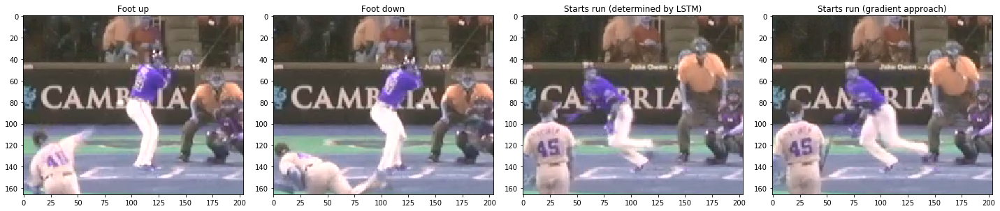


 
 
 

--------------NEW VIDEO ------------------
e4c265b8-796b-42d1-8295-e86e47b20c25
length data (166, 12, 2)
foot highest 87 foot down 95
first step (LSTM):  125 , First step gradient: 124


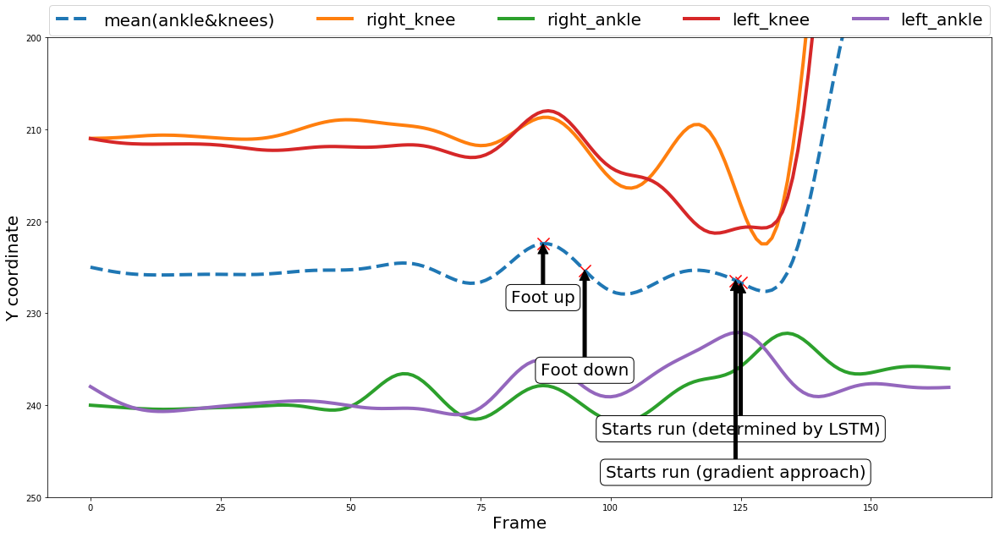

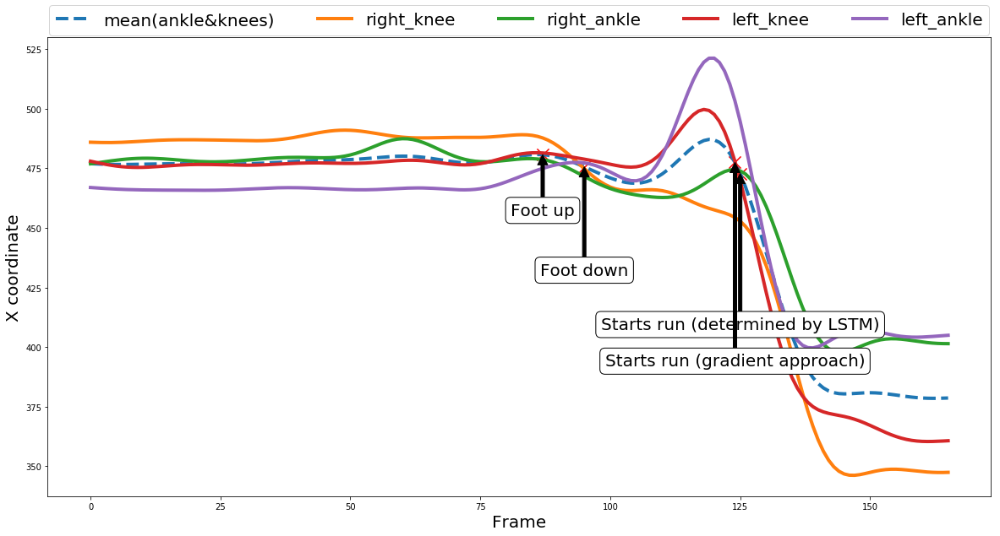

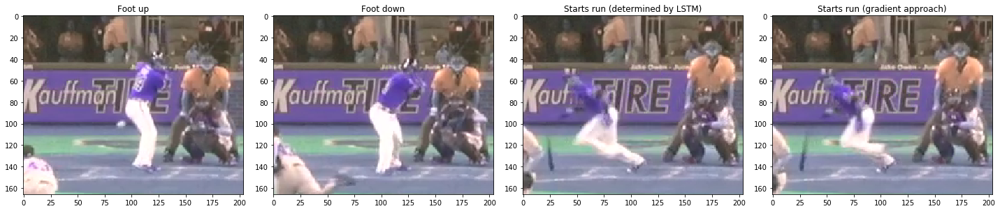


 
 
 

--------------NEW VIDEO ------------------
21f0822e-b084-4711-9b6c-0753c36cfc98
length data (166, 12, 2)
foot highest 81 foot down 81
first step (LSTM):  128 , First step gradient: 129


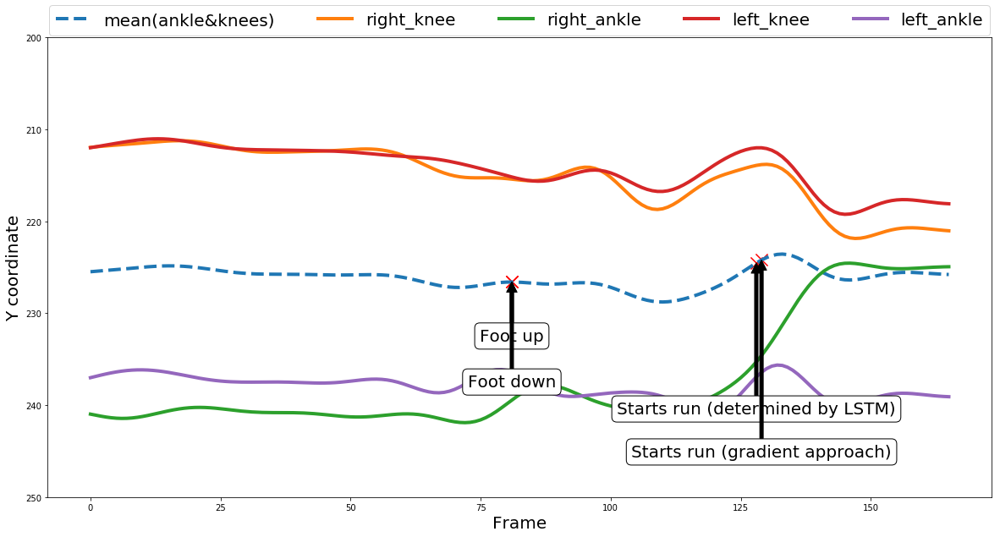

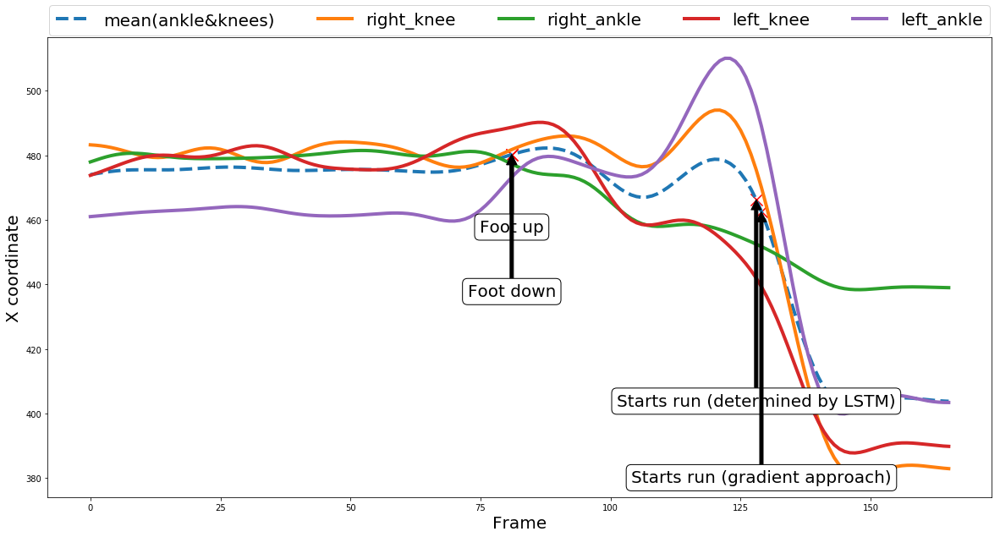

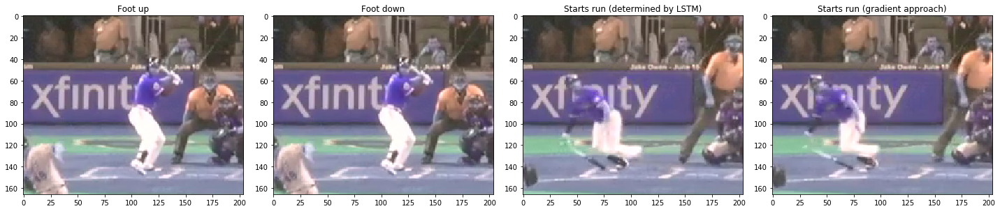


 
 
 

--------------NEW VIDEO ------------------
da908ac0-eae5-4742-a57e-8ccda56108e0
length data (166, 12, 2)
foot highest 95 foot down 104
first step (LSTM):  125 , First step gradient: 124


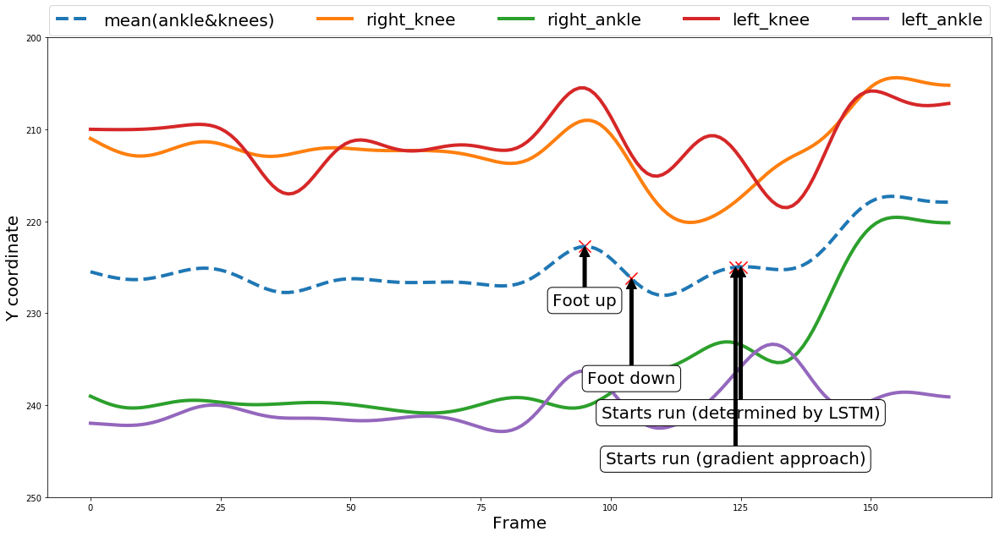

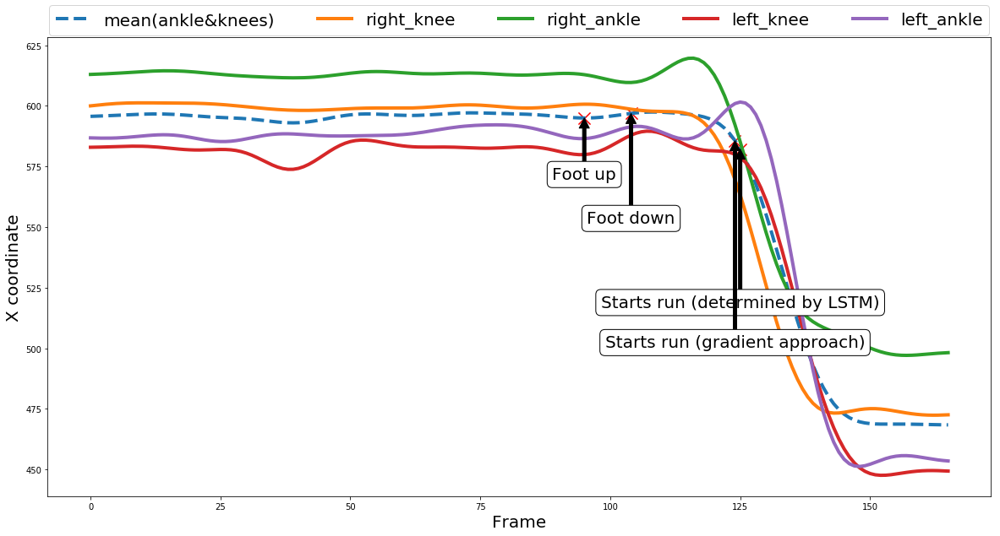

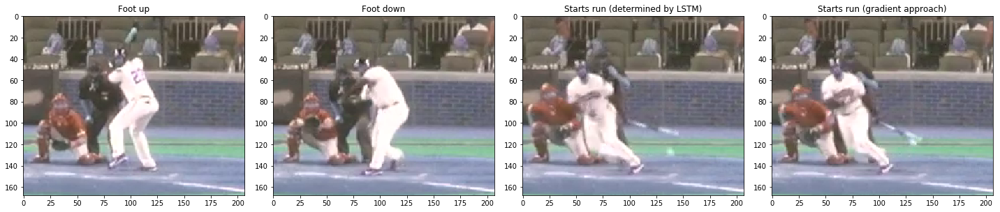


 
 
 

--------------NEW VIDEO ------------------
c6ea2485-4ce1-4edd-b103-5cee4e9b22fb
length data (166, 12, 2)
foot highest 87 foot down 96
first step (LSTM):  126 , First step gradient: 128


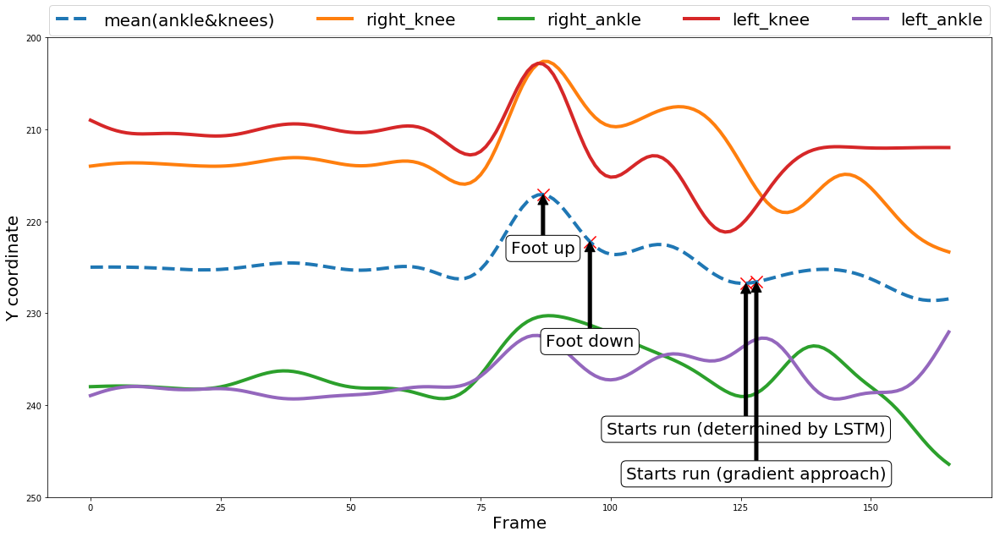

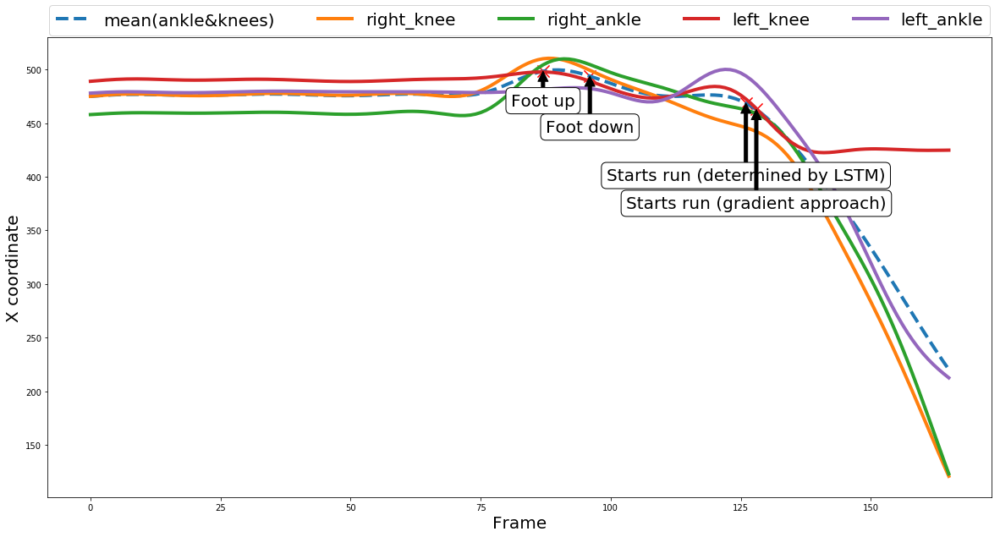

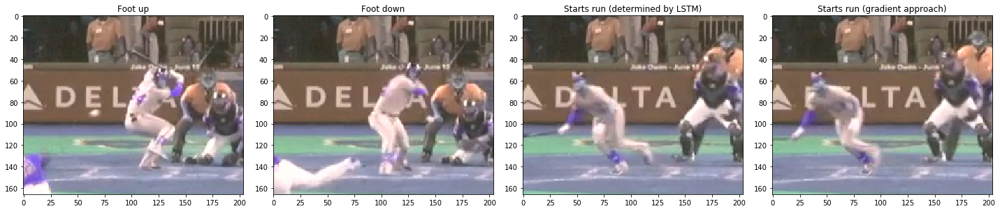


 
 
 

--------------NEW VIDEO ------------------
f4ea3410-f559-464f-acb0-74133d7742e3
length data (166, 12, 2)
foot highest 91 foot down 100
first step (LSTM):  127 , First step gradient: 129


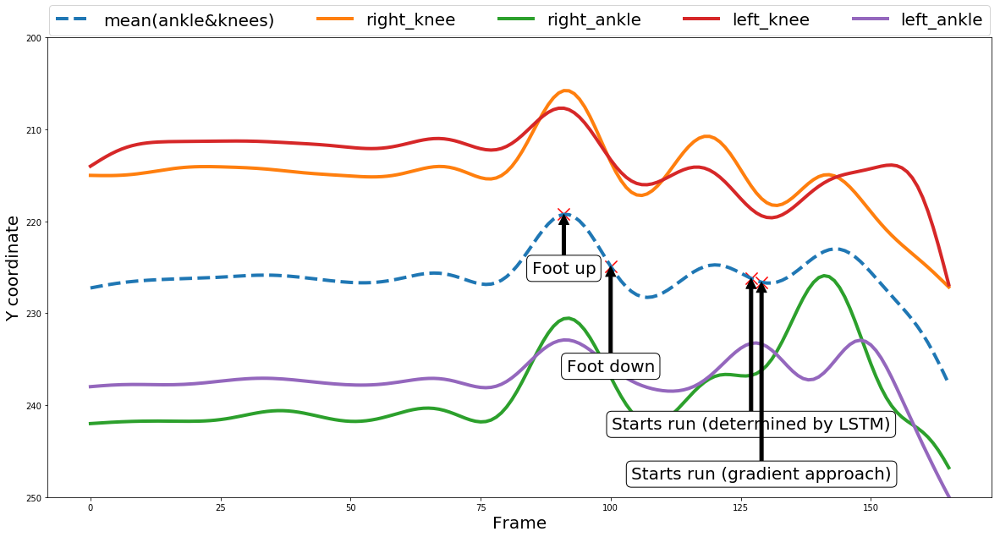

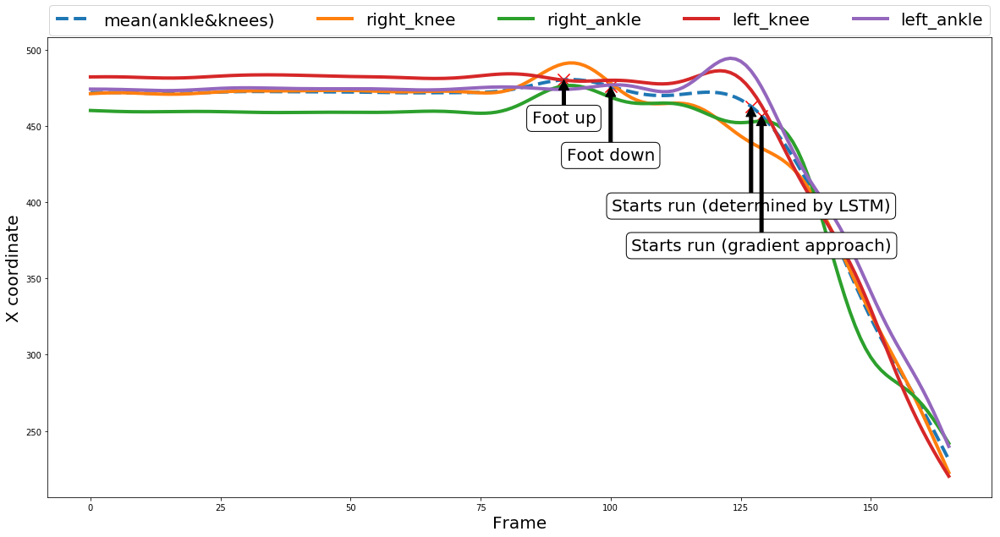

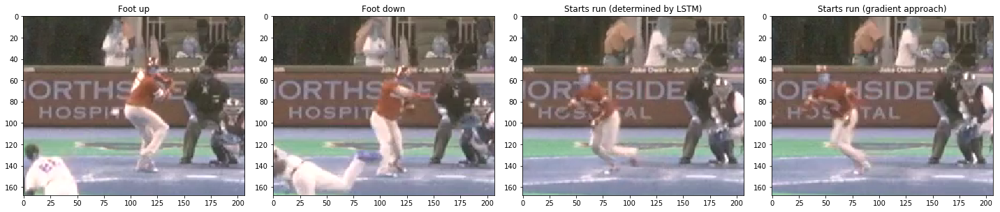


 
 
 

--------------NEW VIDEO ------------------
72d2b9d0-1fb0-469b-9f79-35b9502124ab
length data (165, 12, 2)
foot highest 96 foot down 105
first step (LSTM):  113 , First step gradient: 114


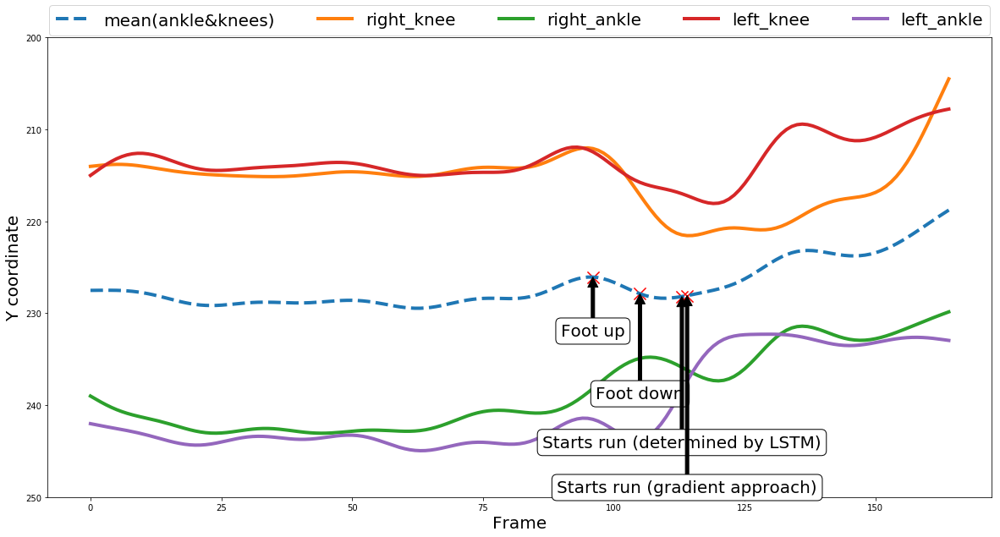

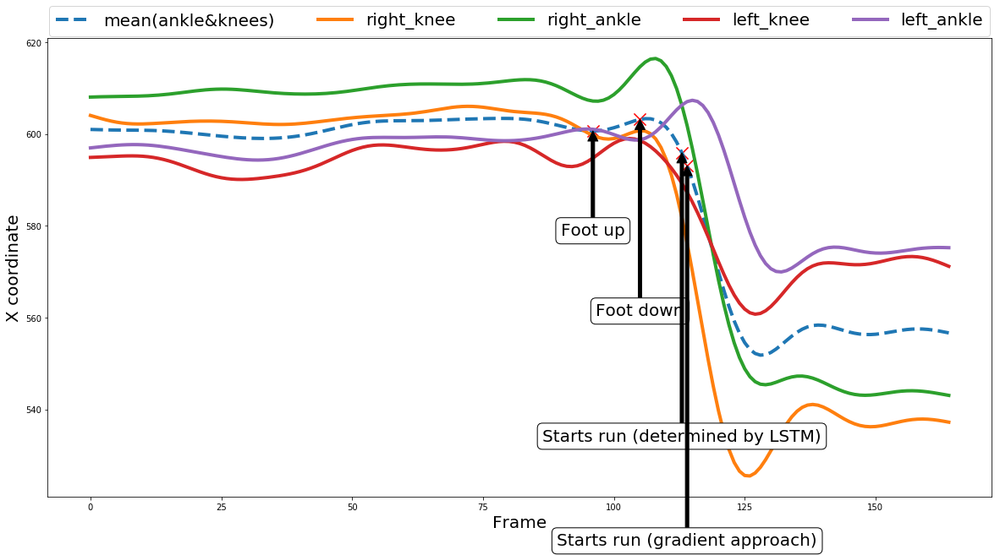

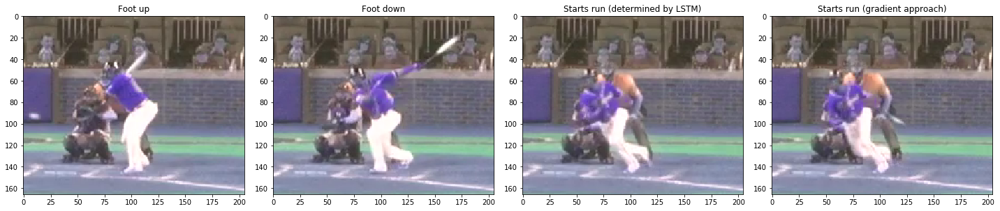


 
 
 

--------------NEW VIDEO ------------------
9c3e389f-32e8-4f3c-b9d3-8c525f8891eb
length data (164, 12, 2)
foot highest 89 foot down 98
first step (LSTM):  124 , First step gradient: 124


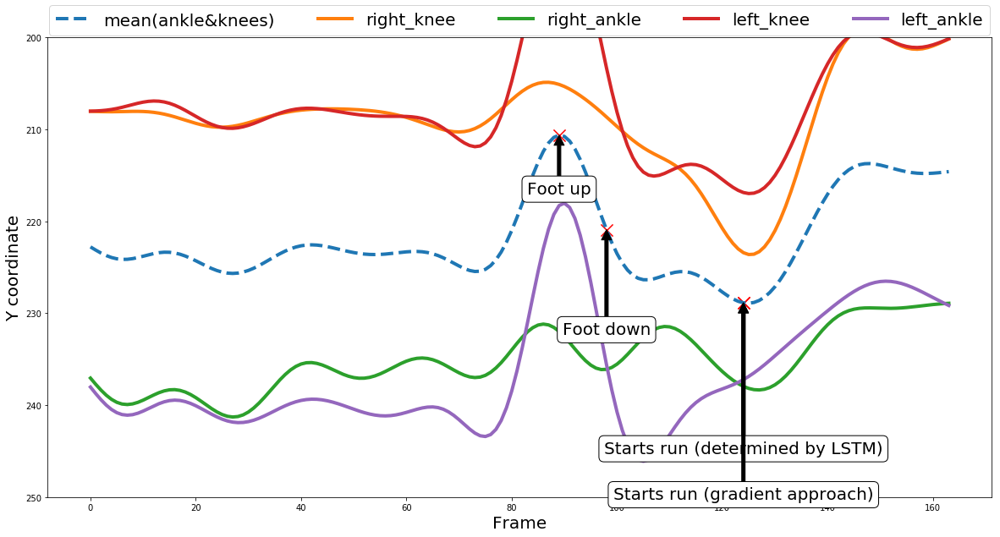

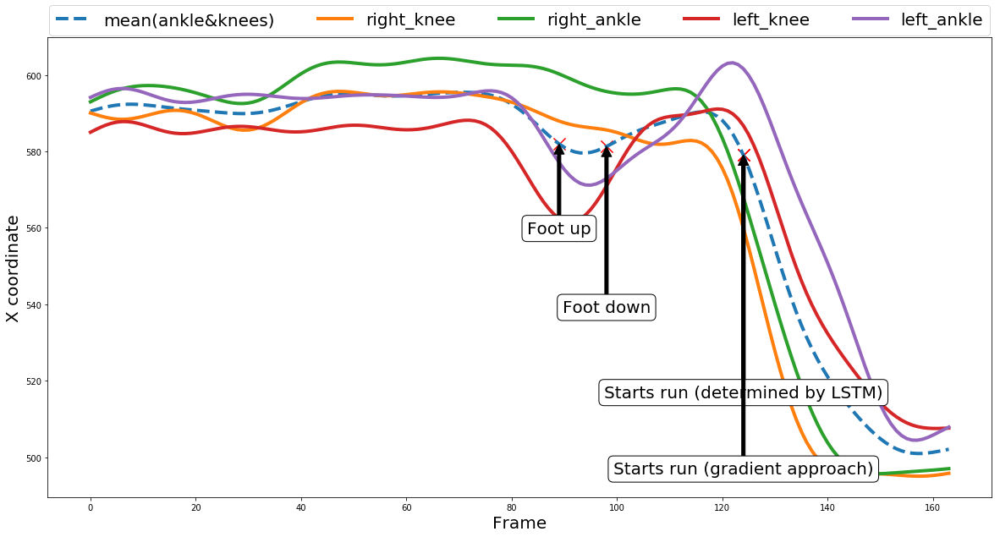

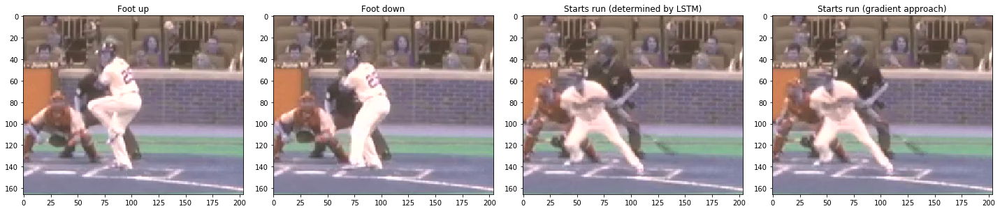


 
 
 

--------------NEW VIDEO ------------------
e420776f-67d8-4833-96fd-88da20de95a1
length data (164, 12, 2)
foot highest 93 foot down 99
first step (LSTM):  131 , First step gradient: 129


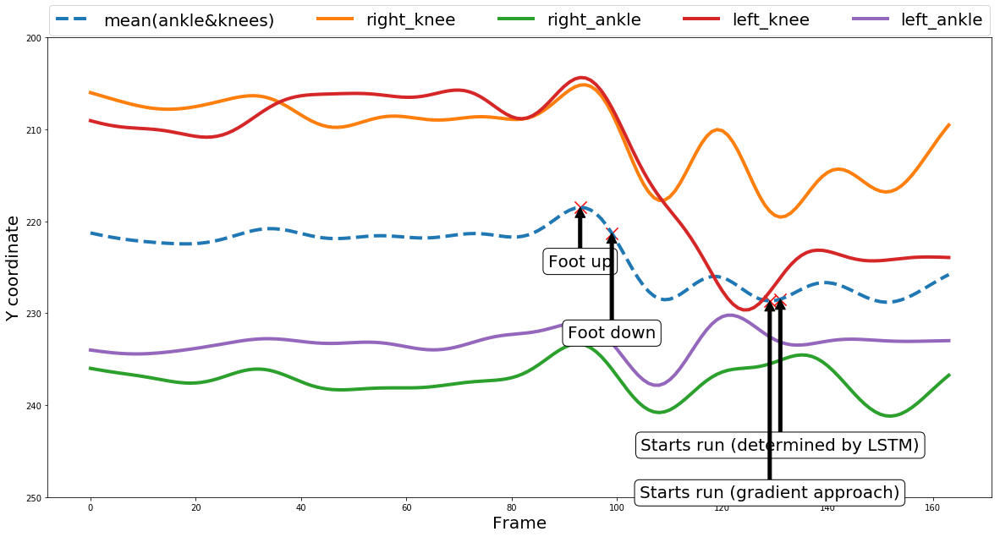

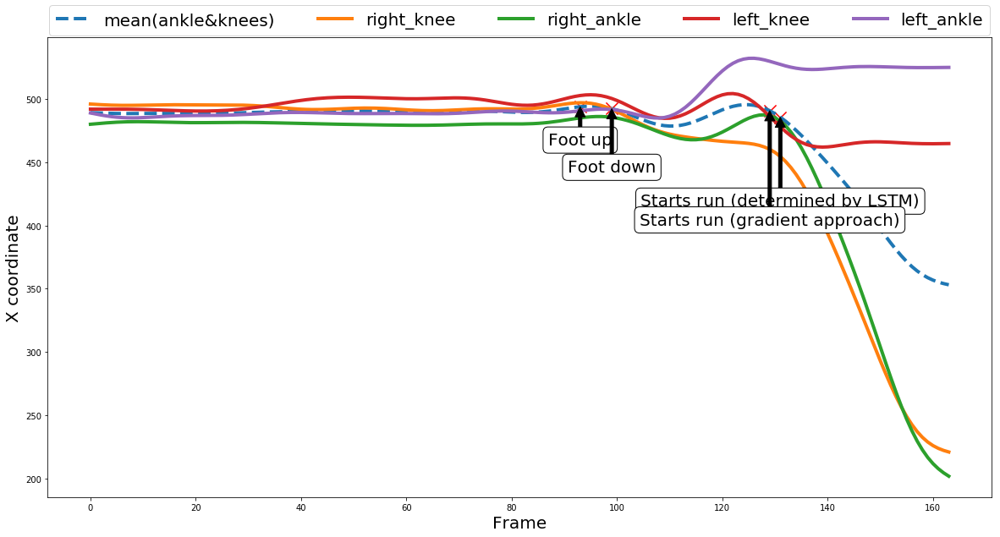

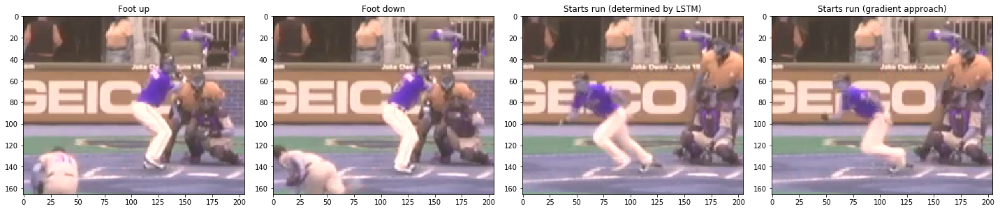


 
 
 

--------------NEW VIDEO ------------------
4343a6e2-17fd-45a6-891f-6619f1be9755
length data (163, 12, 2)
foot highest 90 foot down 97
first step (LSTM):  125 , First step gradient: 125


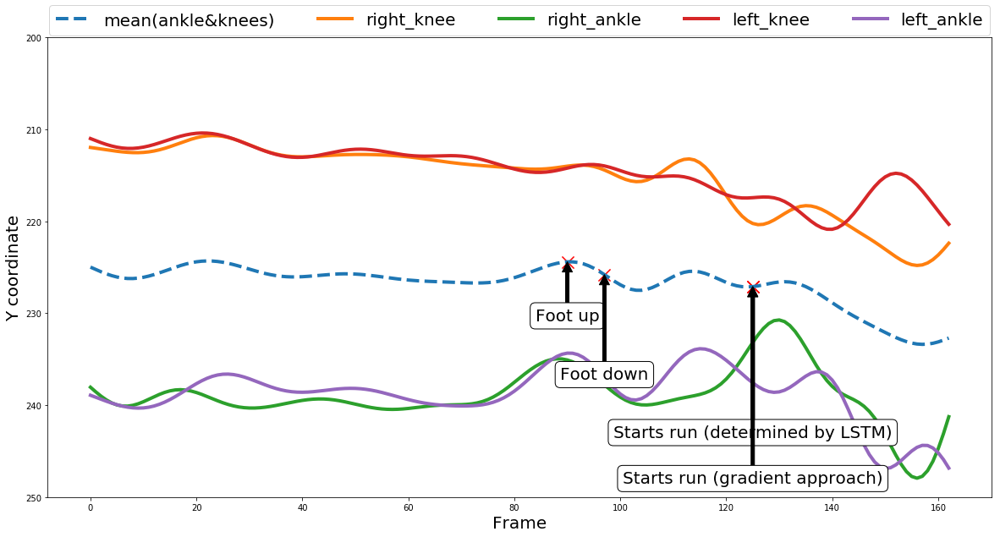

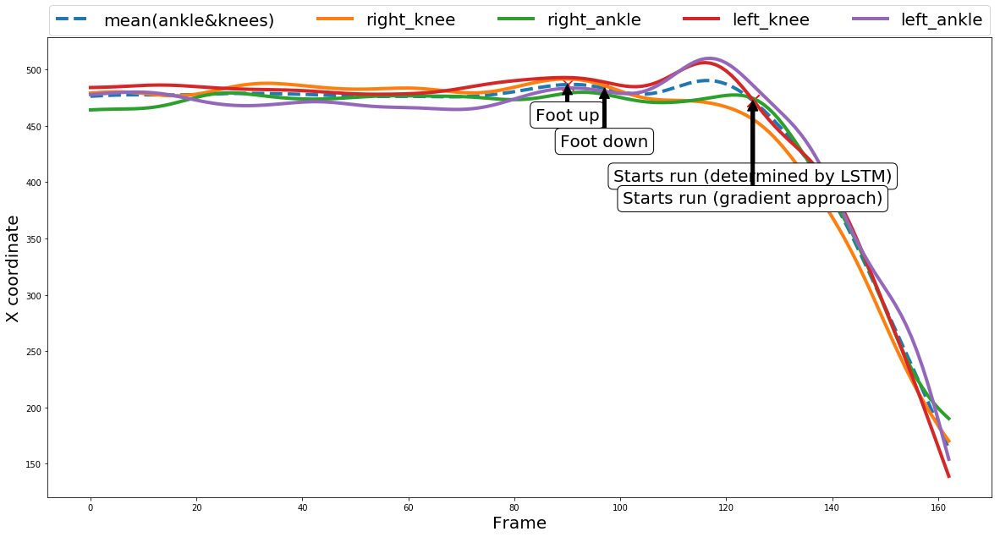

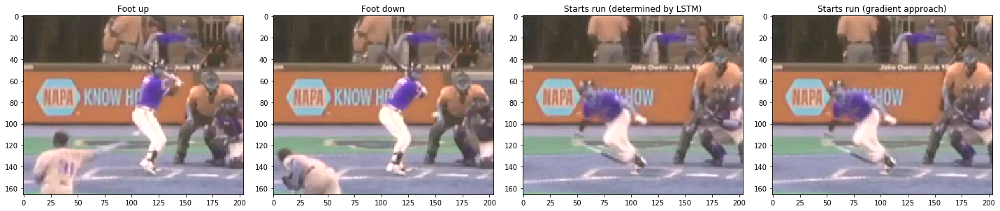


 
 
 

--------------NEW VIDEO ------------------
651bb6ba-c99b-4c16-a550-fee495a5bb59
length data (163, 12, 2)
foot highest 88 foot down 96
first step (LSTM):  123 , First step gradient: 123


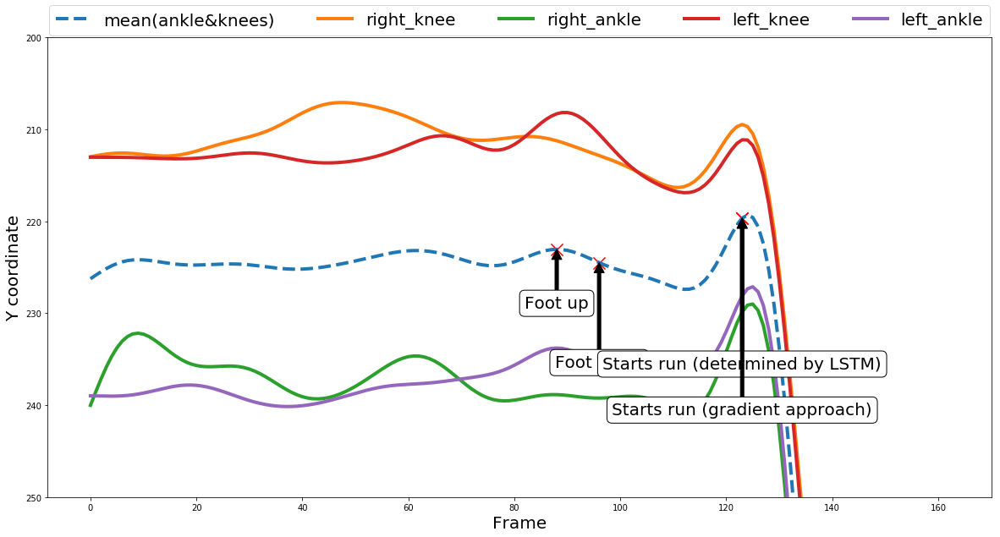

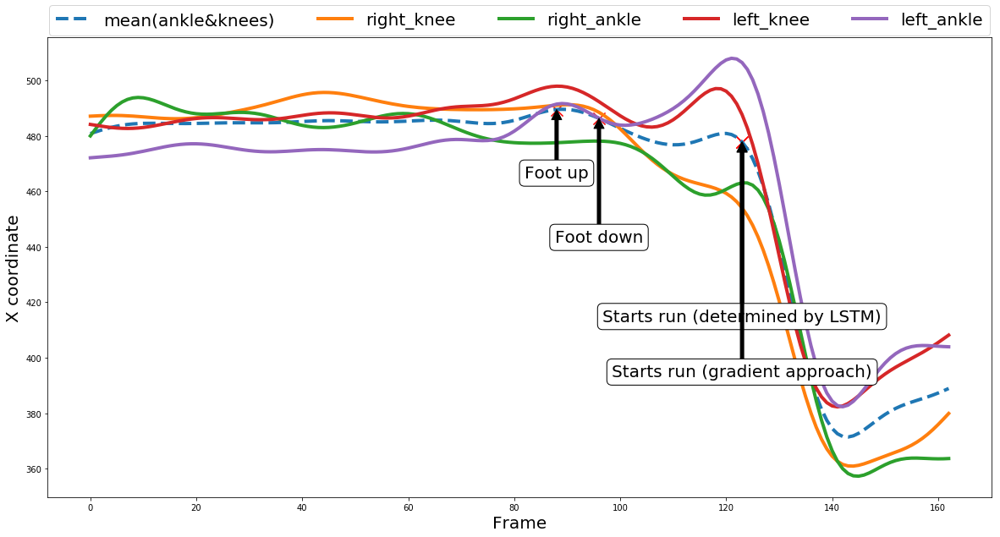

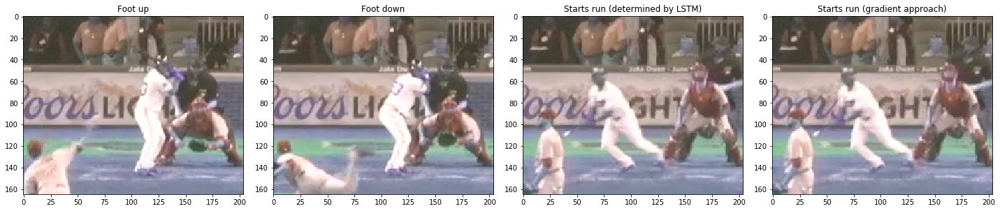


 
 
 

--------------NEW VIDEO ------------------
c22655a9-03a8-428d-a4bf-8fb55a0ac08d
length data (163, 12, 2)
foot highest 90 foot down 99
first step (LSTM):  129 , First step gradient: 134


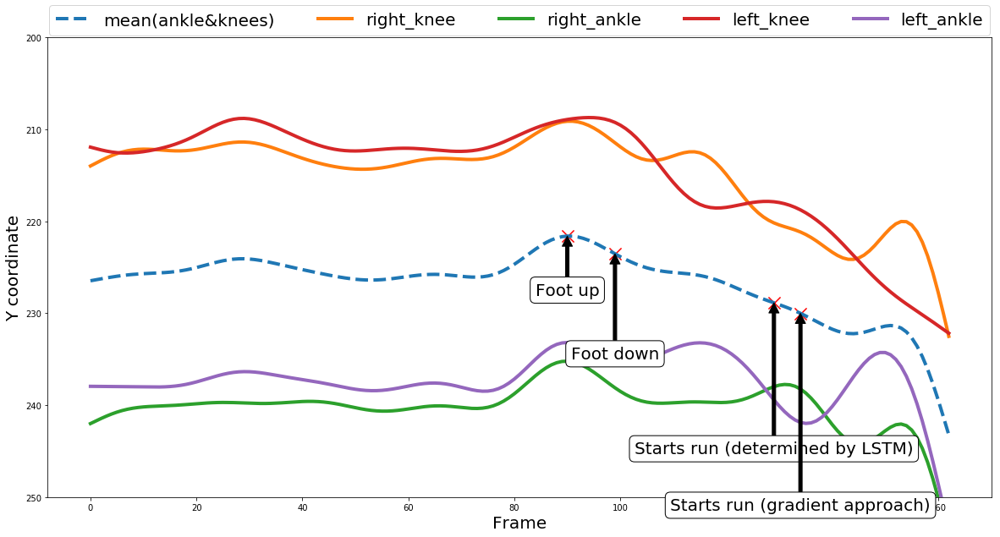

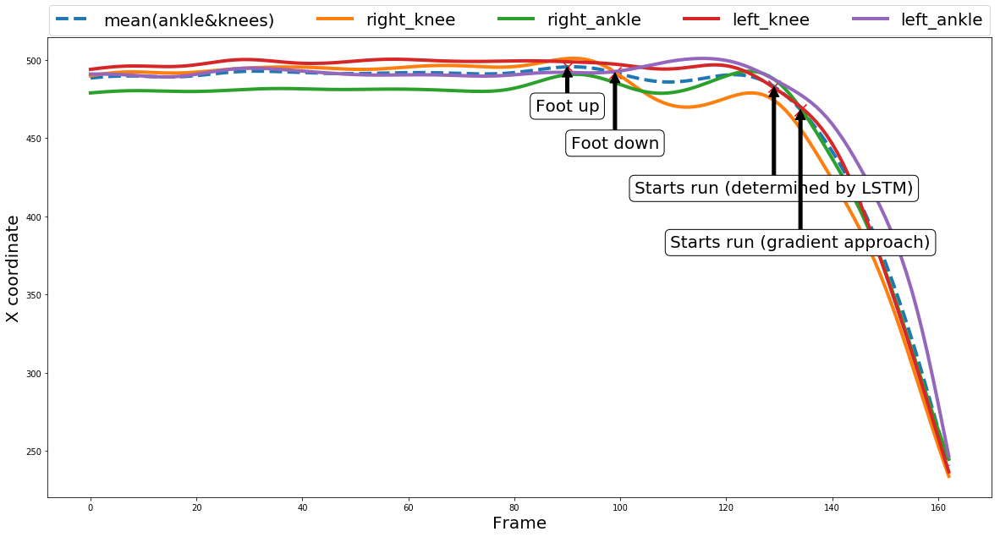

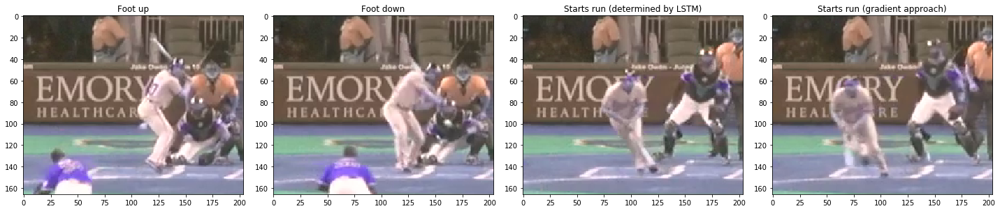


 
 
 

--------------NEW VIDEO ------------------
2389e257-62e1-4b49-ac68-a360b0499960
length data (163, 12, 2)
foot highest 92 foot down 101
first step (LSTM):  117 , First step gradient: 121


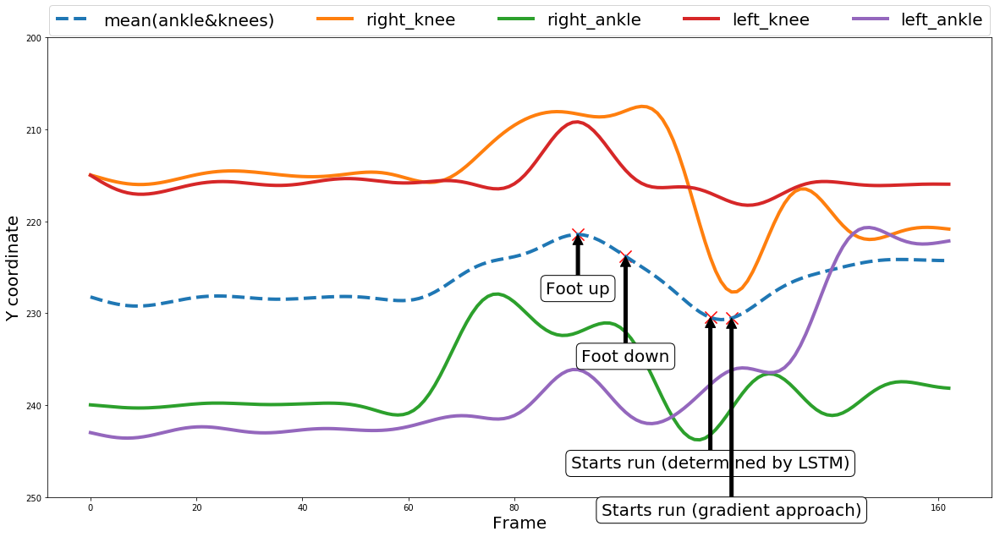

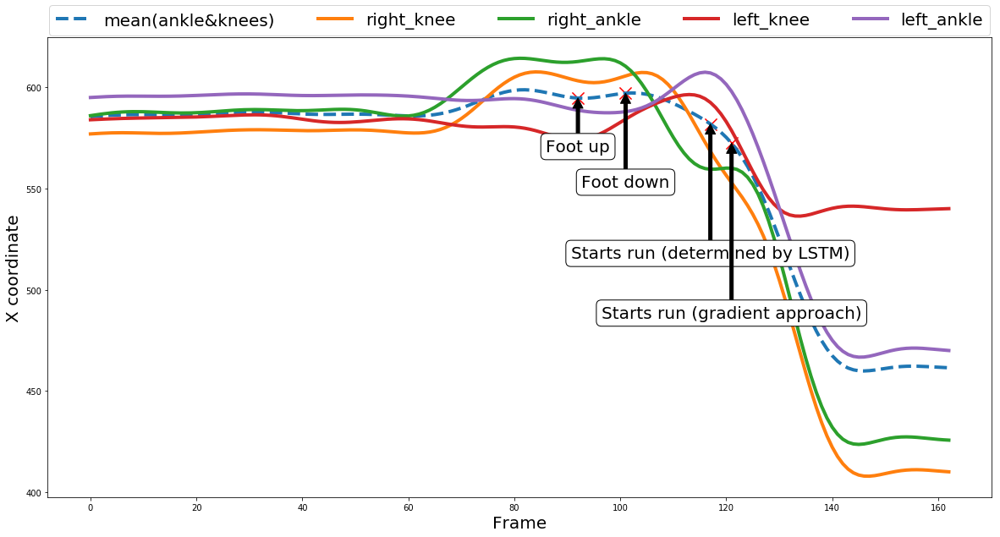

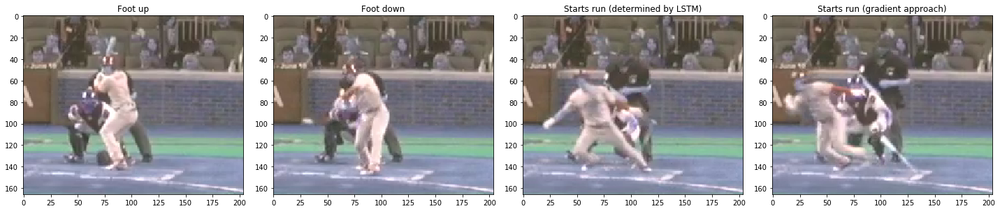

In [8]:
# DELETE FOLLOWING COMMENTS TO SHOW ONLY THE TEST DATA FOR THE BATTERS FIRST STEP
# with open(os.path.join("..", "train_data", "batter_runs", "labels_first_batter_test"), "r") as infile:
  #  test_data_lstm = json.load(infile)

print("Number of videos", len(joints_array_batter))
for video_choice in range(len(joints_array_batter)):
    # DELETE FOLLOWING COMMENTS TO SHOW ONLY THE TEST DATA FOR THE BATTERS FIRST STEP
    # if files[video_choice] not in test_data_lstm.keys():
      #  continue
        
    print("--------------NEW VIDEO ------------------")
    print(files[video_choice])
    
    # Select data
    batter = joints_array_batter[video_choice]
    print("length data", batter.shape)
    
    # Gradient first step
    first_move_grad = first_move_gradient(batter)
    if first_move_grad is None:
        print("GRADIENT APPROACH YIELDS NO RESULT (thus set to 0 in visualization)")
        first_move_grad=0
    
    # LSTM first step
    first_move = first_move_lstm_outputs[video_choice]
    # Foot up, foot down
    foot_up, foot_down = foot_to_ground(batter, release = 90, start_run = first_move)
    
    # Print and visualize results
    print("foot highest", foot_up, "foot down", foot_down)
    result_list =  [foot_up, foot_down, first_move, first_move_grad]  
    print("first step (LSTM): ", first_move, ", First step gradient:", first_move_grad)
    
    # Y trajectories
    plt.figure(figsize = (20,10))
    mean_traj = np.mean(batter[:, relevant_joints, 1], axis=1)
    plt.plot(mean_traj, linestyle="--", label="mean(ankle&knees)", linewidth=4.0)
    for j in relevant_joints:
        plt.plot(batter[:,j, 1], label = joints_list[j], linewidth=4.0)
    plt.scatter(result_list, mean_traj[result_list],s=200, marker='x', color = "red")
    n = ["Foot up", "Foot down", "Starts run (determined by LSTM)", "Starts run (gradient approach)"]
    for i, txt in enumerate(n):
        plt.annotate(txt, (result_list[i], mean_traj[result_list[i]]),  xytext= tuple(np.array([result_list[i], mean_traj[result_list[i]]+5*(i+1)])) , fontsize=20, bbox = dict(boxstyle="round", fc="white"), arrowprops=dict(facecolor='black'), horizontalalignment='center', verticalalignment="top")
    plt.legend(bbox_to_anchor=(0., 1.0, 1., 1.0), loc=3, ncol=7, mode="expand", borderaxespad=0.1, fontsize=20)
    # plt.title("Y gradient")
    plt.xlabel("Frame", fontsize=20)
    plt.ylabel("Y coordinate", fontsize=20)
    plt.ylim(250,200)
    plt.show()
    
    # X trajectories
    plt.figure(figsize = (20,10))
    mean_traj = np.mean(batter[:, relevant_joints, 0], axis=1)
    plt.plot(mean_traj, linestyle="--", label="mean(ankle&knees)", linewidth=4.0)
    for j in relevant_joints:
        plt.plot(batter[:,j, 0], label = joints_list[j], linewidth=4.0)
    plt.scatter(result_list, mean_traj[result_list],s=200, marker='x', color = "red")
    n = ["Foot up", "Foot down", "Starts run (determined by LSTM)", "Starts run (gradient approach)"]
    for i, txt in enumerate(n):
        plt.annotate(txt, (result_list[i], mean_traj[result_list[i]]),  xytext= tuple(np.array([result_list[i], mean_traj[result_list[i]]-20*(i+1)])) , fontsize=20, bbox = dict(boxstyle="round", fc="white"), arrowprops=dict(facecolor='black'), horizontalalignment='center', verticalalignment="top")
    plt.legend(bbox_to_anchor=(0., 1.0, 1., 1.0), loc=3, ncol=7, mode="expand", borderaxespad=0.1, fontsize=20)
    # plt.title("Y gradient")
    plt.xlabel("Frame", fontsize=20)
    plt.ylabel("X coordinate", fontsize=20)
    plt.show()
    
     
    # Load frames for each event
    fig = plt.figure(figsize=(20, 5))
    cap = cv2.VideoCapture(os.path.join(video_path, files[video_choice]+".mp4"))
    for i in open(os.path.join(video_path, files[video_choice]+".mp4.dat")).readlines():
            datContent=ast.literal_eval(i)
    bottom_b=datContent["Batter"]['bottom']
    left_b=datContent["Batter"]['left']
    right_b=datContent["Batter"]['right']
    top_b=datContent["Batter"]['top']
    for ind, i in enumerate(result_list):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        ax = fig.add_subplot(1,len(result_list),ind+1)
        plt.imshow(frame[top_b:bottom_b, left_b:right_b])
        plt.gray()
        plt.title(n[ind])
    plt.tight_layout()
    plt.show()
    
    print("\n \n \n \n")

## Evaluation:

* In some cases, the batter was obviously not detected properly (sometimes, the trajectories are just straight lines until a certain frame, which is because of linear interpolation)
* Counting manually, around 80% of the foot-lift and foot-to-ground labels are correct. In the other cases, it is deteted too late. Either both or none of them is correct
* The LSTM shows similar results as the gradient approach, sometimes even a little bit better (slightly earlier). 

# Check data used for training batter's first movement

### When training the network, in the code of the batter_first_move_train.py file the data must be saved (just uncomment the relevant two lines)

In [9]:
data = np.load(os.path.join("..","train_data","batter_first_data.npy"))
label = np.load(os.path.join("..","train_data","batter_first_label.npy"))

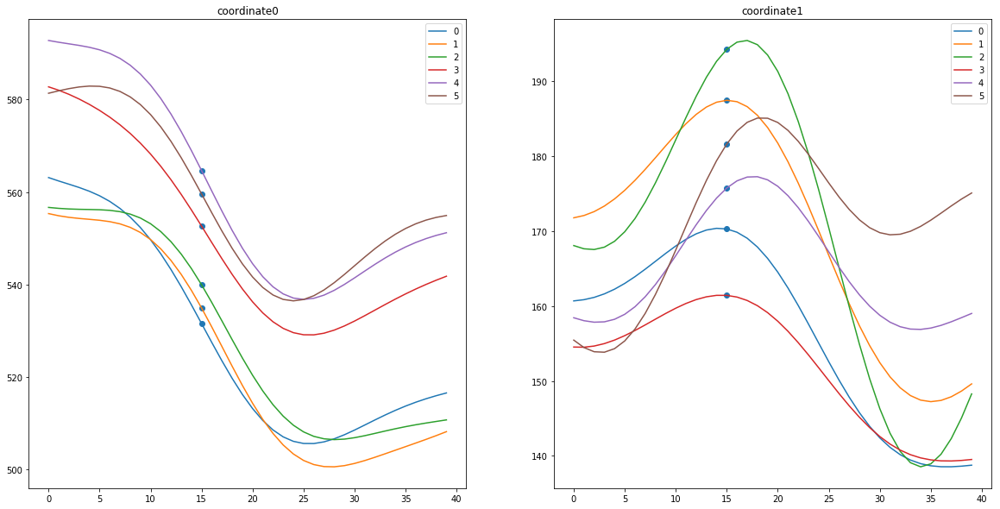

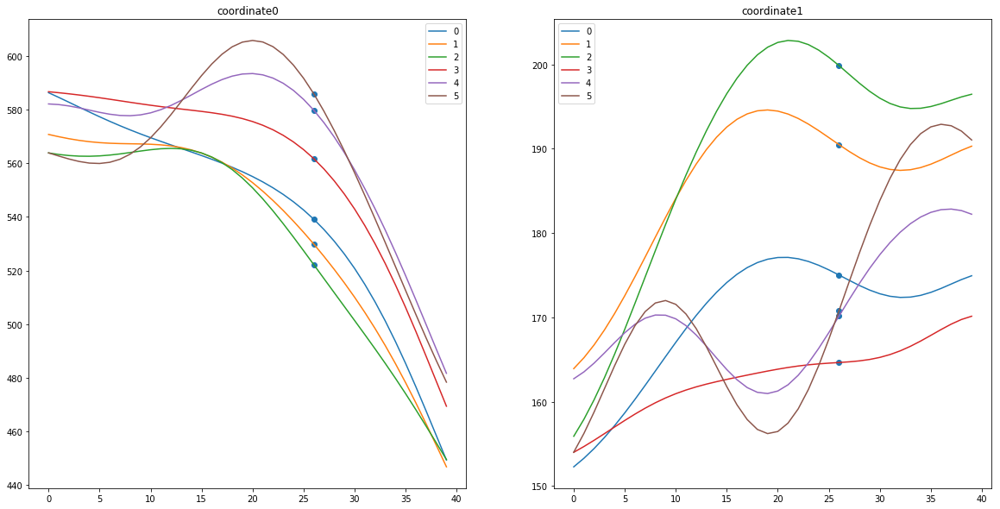

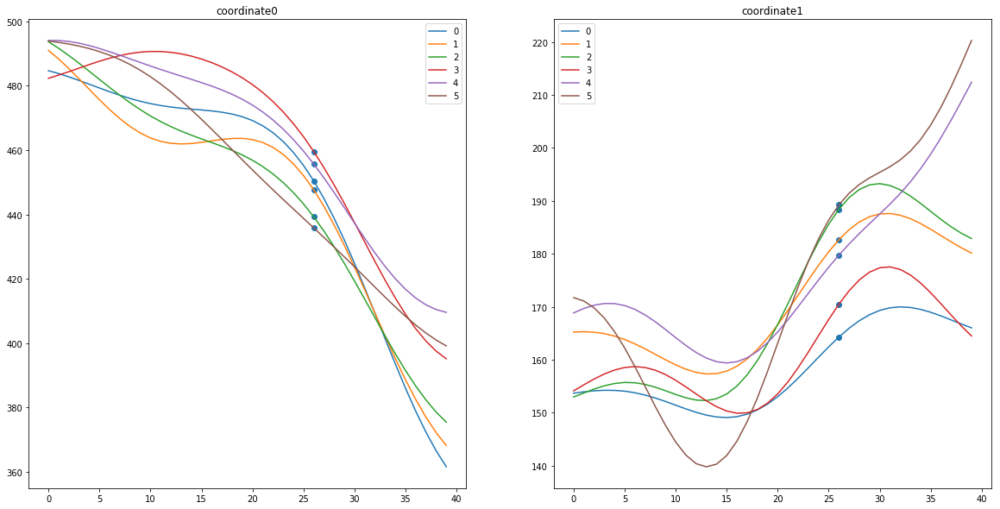

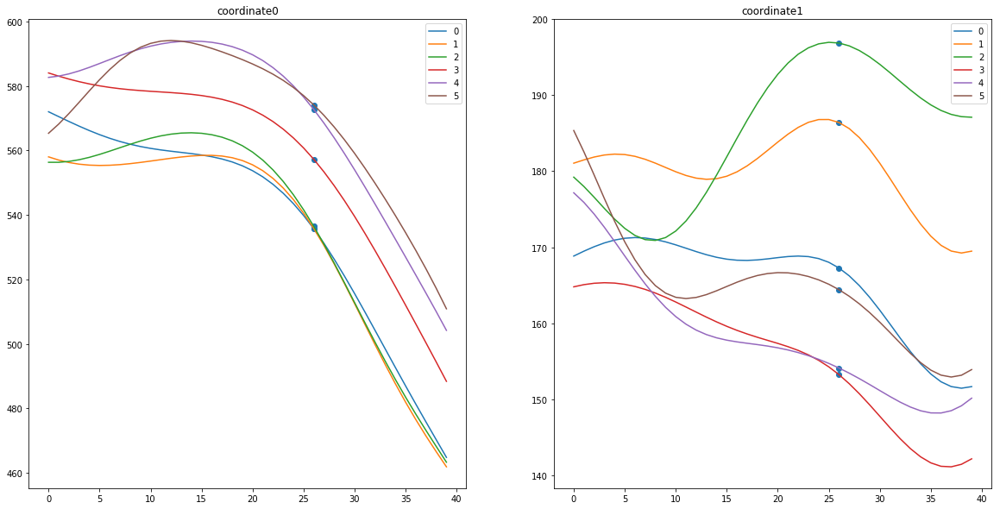

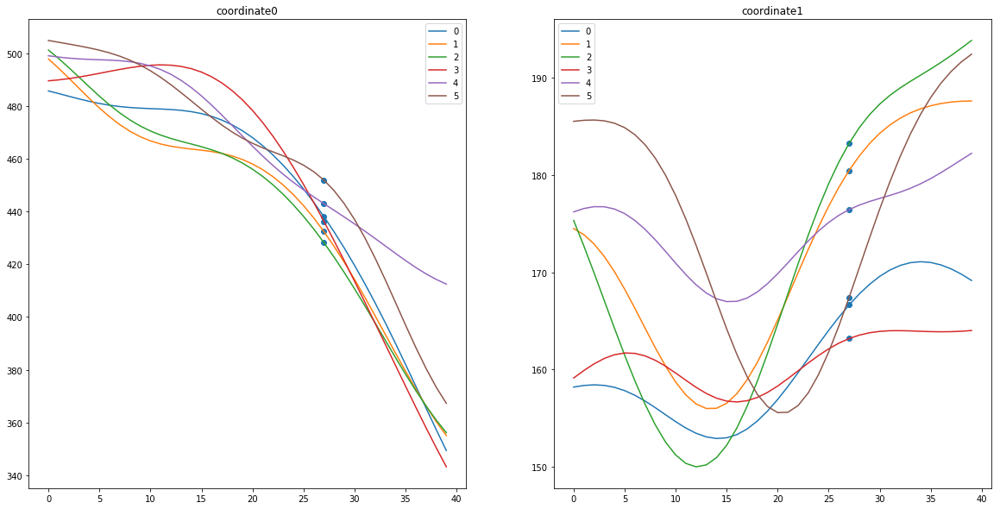

...

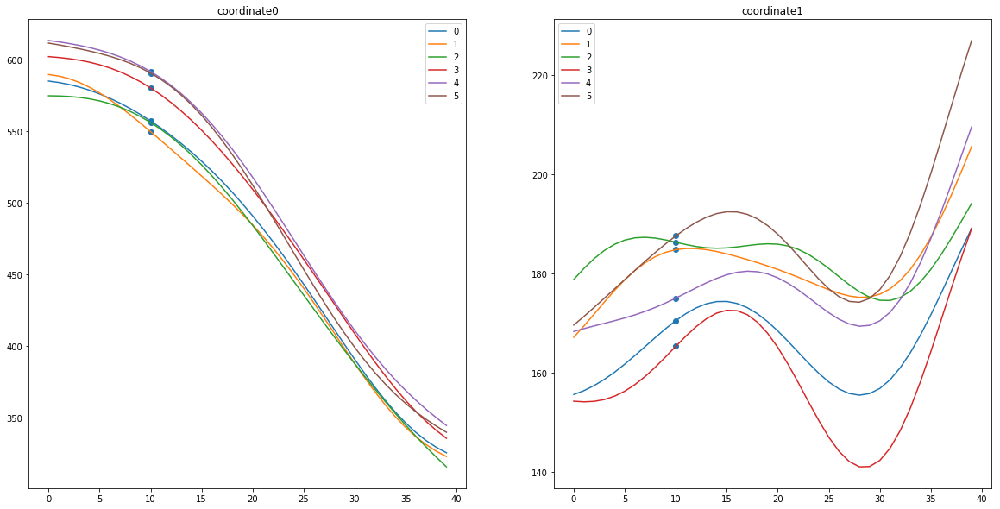

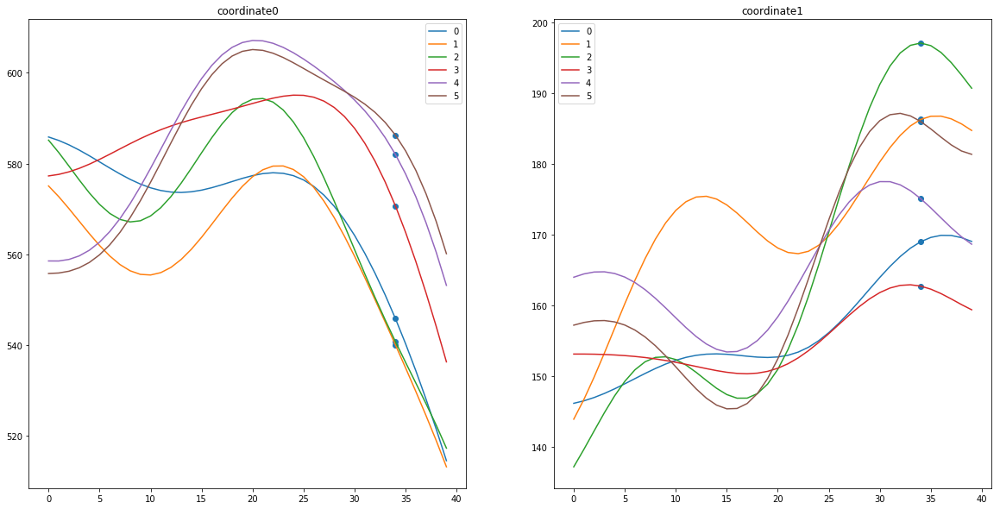

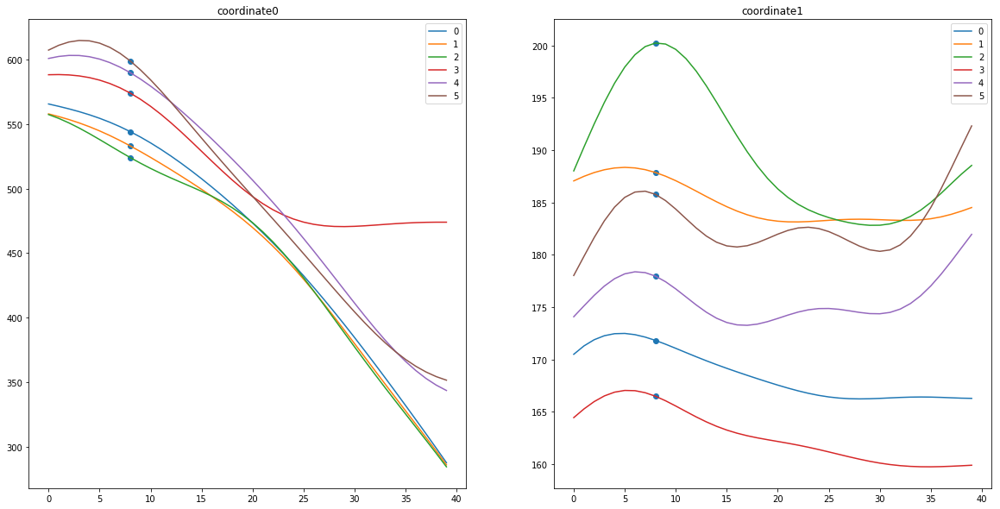

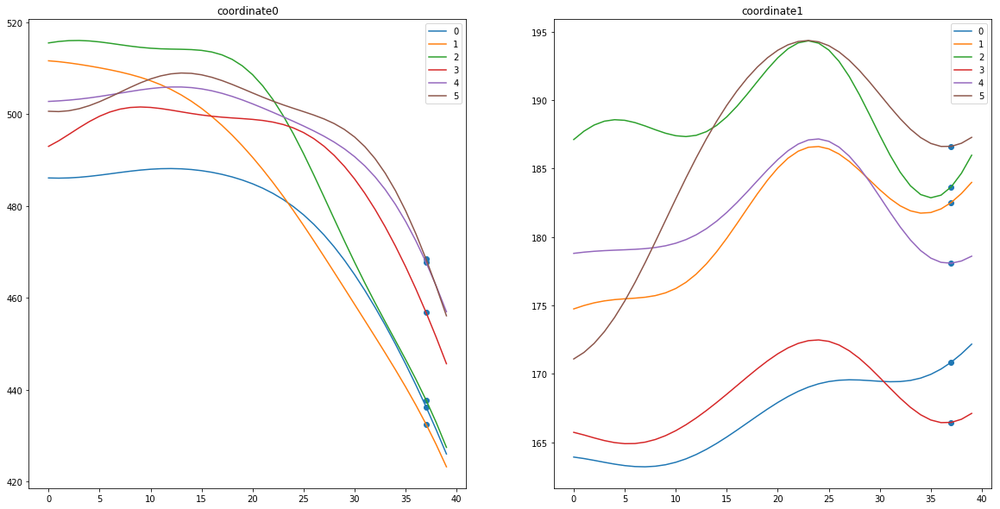

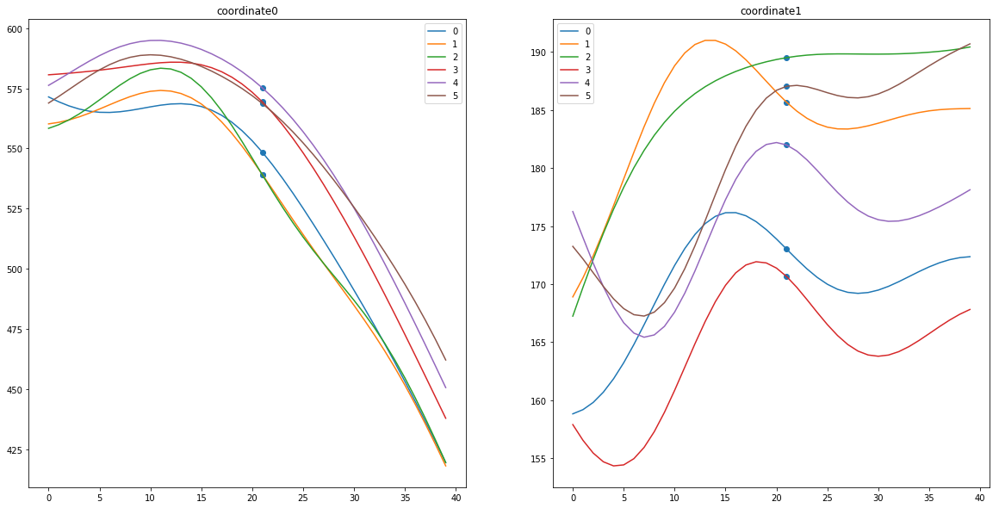

In [10]:
for i in range(20):
    plt.figure(figsize = (20,10))
    for k in range(2):
        first_move = label[i]
        if first_move==len(data[0]):
            print("same")
            continue
        plt.subplot(1,2,k+1)
        for j in range(6):
            plt.plot(data[i,:,j, k], label = j)
        plt.legend()
        plt.scatter(np.array([int(first_move) for _ in range(6)]).astype(int), np.array(data[i, int(first_move), list(np.arange(0,6,1)),k]))
        plt.title("coordinate"+str(k))
    plt.show()

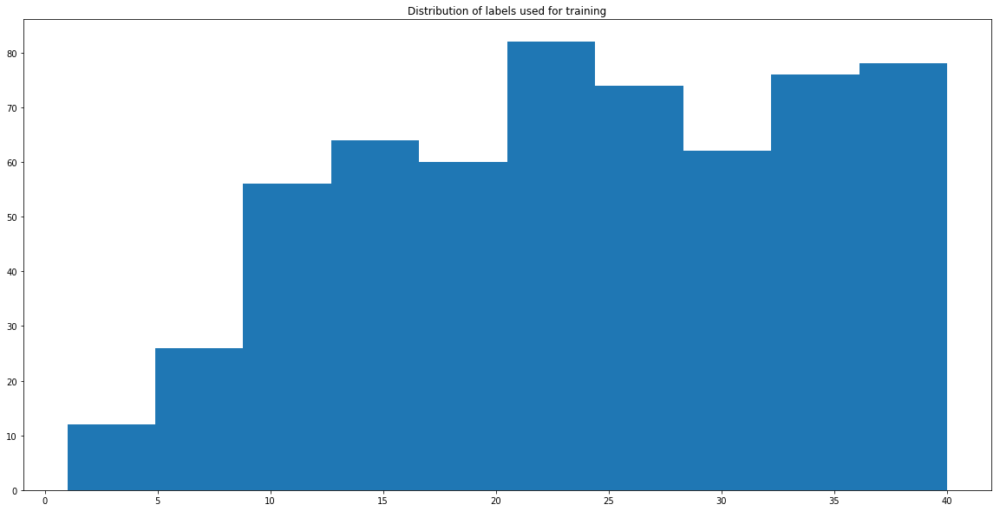

In [11]:
plt.figure(figsize=(20,10))
plt.hist(label)
plt.title("Distribution of labels used for training")
plt.show()